In [4]:
# --------------------------------------------------------------------
# Importing required libraries
# --------------------------------------------------------------------
import random
import numpy as np
import pandas as pd
import PIL.Image as Image
from glob import glob
from mymodels import (
    ReconNet,
    VisionTransformerTimeSeriesFormalizedWithSAR,
)
from mymodels.unet import Unet
from mymodels.discriminatorv2 import Discriminator
import matplotlib.pyplot as plt
from myutils import imshow
from datetime import datetime

# importing pytorch functions
import torch
from torchvision.utils import make_grid
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as tvtransforms
from torch.nn import SmoothL1Loss, BCELoss

# importing utils required in th code
from utils import subsample
from utils import transforms
from utils.evaluate import ssim, psnr, nmse
from utils.losses import (
    SSIMLoss,
    SSIMLoss_V1,
    MultiScaleLoss,
    spectral_angle_mapper_numpy,
    peak_signal_to_noise_ratio,
    structural_similarity_index,
)
from utils.process import transform_tensor_image, RealisticCloudMaskFunc
from osgeo import gdal
import torch.nn.functional as F
from torch.utils.tensorboard import SummaryWriter
from sklearn.metrics import mean_squared_error
import math

# Device
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"
# device = 'cuda'
# np.random.seed(42)
# random.seed(42)

print("******* STARTED AT ************", datetime.now())

******* STARTED AT ************ 2025-01-08 16:47:13.049276


## Initialization 

In [5]:
class ImagenetDataset(Dataset):
    def __init__(
        self,
        if_SAR=True,
        isval=False,
        add_cloud_mask=True,
        add_kspace_mask=False,
        add_random_time_mask=False,
        val_path="/home/snt/projects_lujun/vitCausalSeries/data/intermediate_SAR/output_patches_time_series_with_city/val",
        train_path="/home/snt/projects_lujun/vitCausalSeries/data/intermediate_SAR/output_patches_time_series_with_city/train",
    ):

        self.add_cloud_mask = add_cloud_mask
        self.add_kspace_mask = add_kspace_mask
        self.add_random_time_mask = add_random_time_mask
        self.if_SAR = if_SAR
        self.val_path = val_path
        self.train_path = train_path
        if isval:
            ## combine paths of each imagenet validation image into a single list
            self.files = []
            pattern = "*.tif"
            for dir, _, _ in os.walk(self.val_path):
                self.files.extend(glob(os.path.join(dir, pattern)))
        else:
            ## combine paths of each imagenet training image into a single list
            self.files = []  # get path of each imagenet images
            pattern = "*.tif"
            for dir, _, _ in os.walk(self.train_path):
                self.files.extend(glob(os.path.join(dir, pattern)))

        self.transform = transform_tensor_image
        self.factors = [2, 3, 4, 5, 6, 7, 8, 9, 10]

    def read_tiff(self, file_path):
        dataset = gdal.Open(file_path)
        if not dataset:
            raise FileNotFoundError(f"Unable to open the file: {file_path}")
        band_count = dataset.RasterCount
        bands_data = []
        for i in range(1, band_count + 1):
            band = dataset.GetRasterBand(i)
            band_name = band.GetDescription()
            band_data = band.ReadAsArray()
            bands_data.append(band_data)

        image = np.stack(bands_data, axis=0)
        return image

    def get_mask_func(
        self,
        samp_style,
        factor,
    ):
        center_fractions = 0.08 * 4 / factor
        if samp_style == "random":
            mask_func = subsample.RandomMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        elif samp_style == "equidist":
            mask_func = subsample.EquispacedMaskFunc(
                center_fractions=[center_fractions],
                accelerations=[factor],
            )
        return mask_func

    def add_gaussian_noise(self, x):
        ch, row, col = x.shape
        mean = 0
        var = 0.05
        sigma = var**0.5
        gauss = np.random.normal(mean, sigma, (ch, row, col))
        gauss = gauss.reshape(ch, row, col)
        noisy = x + gauss
        return noisy.float()

    def __len__(
        self,
    ):
        return len(self.files)

    def __getitem__(self, idx):
        if self.if_SAR:
            channel_count = 13
        else:
            channel_count = 11
        tiff = torch.from_numpy(self.read_tiff(self.files[idx]))
        file_path = self.files[idx]
        file_name = os.path.basename(file_path)
        tiff = self.transform(tiff, target_size=64 * 3, crop_size=60 * 3)
        channels, height, width = tiff.shape
        time_span = int((channels - 1) / channel_count)
        images = np.split(
            tiff, [channel_count * (i + 1) for i in range(time_span)], axis=0
        )
        original_spaces_transformed = []
        masked_spaces = []
        cloud_masks = []
        added_cloud_masks = []

        random_index = random.randint(0, len(images) - 2)
        for i in range(len(images) - 1):
            y = images[i]
            cloud_mask = torch.isnan(y).any(dim=0)
            cloud_mask = (~cloud_mask).int()
            y[:, cloud_mask == 0] = 0
            original_spaces_transformed.append(y.clone())
            masked_kspace = y.clone()

            if random.uniform(0, 1) < 0.5:
                y = torch.rot90(y, 1, [-2, -1])

            if random.uniform(0, 1) < 0.5:
                samp_style = "random"
            else:
                samp_style = "equidist"

            # factor = random.choice(self.factors)
            mask_func = self.get_mask_func(samp_style, factor=2.0)

            if self.add_kspace_mask:  # add kspace mask
                masked_kspace, _ = transforms.apply_mask(masked_kspace, mask_func)
            if self.add_cloud_mask:  # add cloud mask
                masked_kspace, added_cloud_mask = RealisticCloudMaskFunc(masked_kspace)
                added_cloud_masks.append(added_cloud_mask.unsqueeze(0))
            else:
                added_cloud_masks.append(torch.ones_like(cloud_mask.unsqueeze(0)))
            if self.add_random_time_mask:  # add time loss mask
                if i == random_index:
                    masked_kspace = masked_kspace.zero_()

            masked_spaces.append(masked_kspace)
            cloud_masks.append(cloud_mask.unsqueeze(0))

        cls_targets = np.squeeze(images[-1])
        unique_classes = torch.unique(cls_targets[~torch.isnan(cls_targets)])
        num_class = len(unique_classes)

        cls_targets = torch.nan_to_num(cls_targets, nan=num_class)
        cls_targets = cls_targets.long()

        # masked_kspace = self.add_gaussian_noise(y)
        masked_space_concat = torch.cat(masked_spaces, dim=0)
        original_spaces_transformed_concat = torch.cat(
            original_spaces_transformed, dim=0
        )
        cloud_mask_concat = torch.cat(cloud_masks, dim=0)
        added_cloud_masks_concat = torch.cat(added_cloud_masks, dim=0)
        return (
            masked_space_concat,  # inputs
            original_spaces_transformed_concat,  # tragets
            cloud_mask_concat,
            added_cloud_masks_concat,
            cls_targets,
            file_name,
        )


train_dataset = ImagenetDataset(
    if_SAR=True,
    isval=False,
    add_cloud_mask=True,
    add_kspace_mask=True,
    add_random_time_mask=True,
)
val_dataset = ImagenetDataset(
    if_SAR=True,
    isval=True,
    add_cloud_mask=True,
    add_kspace_mask=True,
    add_random_time_mask=True,
)

batch_size = 15
seed = 42
torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)


trainloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=2,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)
valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)

Test the mask and future application

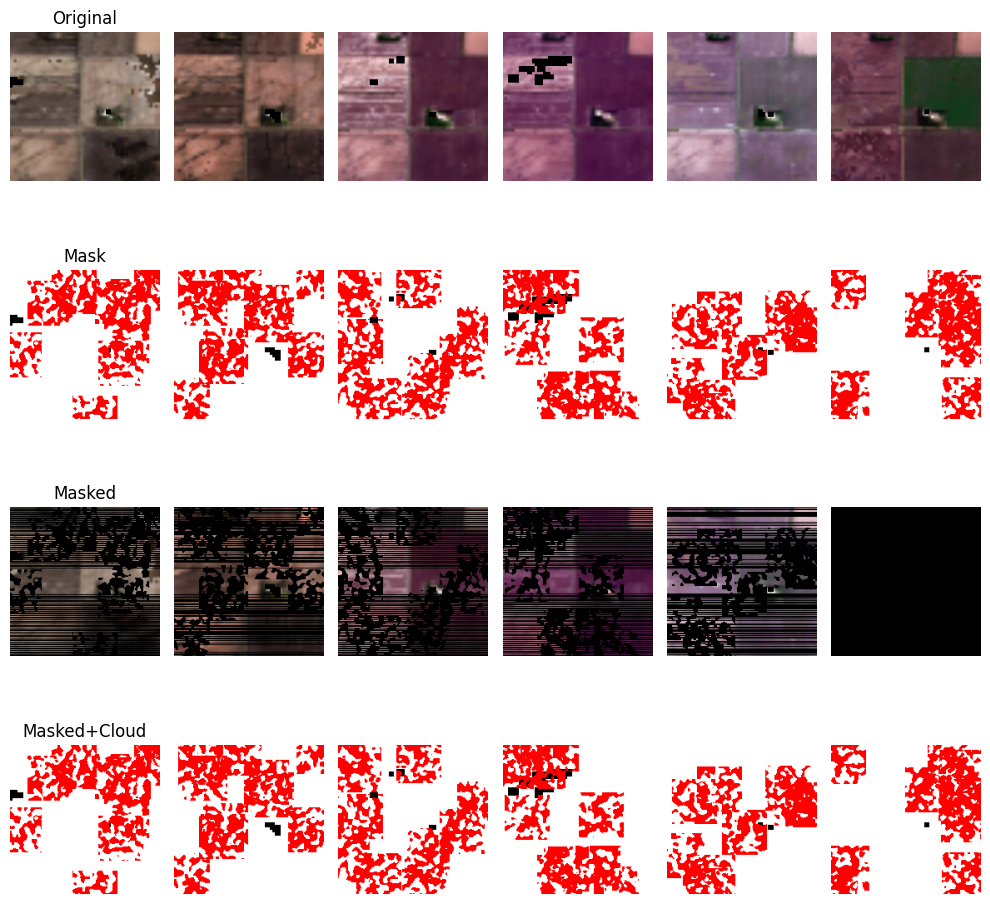

In [6]:
def read_tiff(file_path):
    dataset = gdal.Open(file_path)
    if not dataset:
        raise FileNotFoundError(f"Unable to open the file: {file_path}")
    band_count = dataset.RasterCount
    bands_data = []
    for i in range(1, band_count + 1):
        band = dataset.GetRasterBand(i)
        band_name = band.GetDescription()
        band_data = band.ReadAsArray()
        bands_data.append(band_data)

    image = np.stack(bands_data, axis=0)
    return image


def create_time_series_pseudo_color_image(
    multi_channel_array, cloud_mask, added_cloud_mask
):
    channel_count = 13
    if len(multi_channel_array.shape) != 3:
        raise ValueError("Input Array Shold be H W C")
    channel_list = [3, 2, 1]
    channels, h, w = multi_channel_array.shape
    time_span = int((channels - 1) / channel_count)
    images = np.split(
        multi_channel_array, [channel_count * (i + 1) for i in range(time_span)], axis=0
    )
    cloud_masks = np.split(cloud_mask, [i + 1 for i in range(time_span)], axis=0)
    added_cloud_masks = np.split(
        added_cloud_mask, [i + 1 for i in range(time_span)], axis=0
    )
    time_series_images = []
    background_cloud_images = []
    for i, image in enumerate(images):
        image = np.transpose(image, (1, 2, 0))
        pseudo_color_image = image[:, :, channel_list]
        time_series_images.append(pseudo_color_image)

        # nan_mask = np.isnan(pseudo_color_image).any(axis=-1)  # 掩码，标记 NaN 的位置

        background_cloud_image = np.full((h, w, 3), 0, dtype=np.uint8)  # ALL black
        background_cloud_image[cloud_masks[i].squeeze(0) == 1] = [
            255,
            255,
            255,
        ]  # Eecept mask white

        background_cloud_image[added_cloud_masks[i].squeeze(0) == 0] = [
            255,
            0,
            0,
        ]
        background_cloud_images.append(background_cloud_image)

    return time_series_images, background_cloud_images


def test_image_transformation(dataset, idx):

    (
        masked_kspace,
        original_image,
        cloud_mask,
        added_cloud_masks_concat,
        cls_target,
        _,
    ) = dataset[idx]
    time_series_images_original, background_cloud_images_original = (
        create_time_series_pseudo_color_image(
            original_image, cloud_mask, added_cloud_masks_concat
        )
    )
    time_series_images_masked, background_cloud_images_masked = (
        create_time_series_pseudo_color_image(
            masked_kspace, cloud_mask, added_cloud_masks_concat
        )
    )
    all_images = [
        time_series_images_original,
        background_cloud_images_original,
        time_series_images_masked,
        background_cloud_images_masked,
    ]

    fig, axes = plt.subplots(
        len(all_images), len(time_series_images_masked), figsize=(10, 10)
    )
    dict_name = {
        0: "Original",
        1: "Mask",
        2: "Masked",
        3: "Masked+Cloud",
    }
    for i, image_list in enumerate(all_images):
        for j in range(len(image_list)):
            axes[i][j].imshow(image_list[j])
            axes[i][j].axis("off")
            if j == 0:  # Add a title only to the first image of each row
                axes[i][j].set_title(dict_name[i + j])

    plt.tight_layout()
    plt.show()


idx = 18
test_image_transformation(train_dataset, idx)

In [7]:
# --------------------------------------------------------------------
# Initialising Models
# --------------------------------------------------------------------
masked_kspace, _, _, _, _, _ = train_dataset[0]
C, H, W = masked_kspace.shape

channel_count = 13
avrg_img_size = 180  # Don't change this
patch_size = 5  # 10
depth = 6
num_heads = 8
embed_dim = 64  # 64
time_span = C // channel_count
in_chans = C
epoch_max = 100
lr = 1e-4
is_SGD = False
batch_size = 20
seed = 42
if_SAR = True
num_classes = 2

current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = f"/home/snt/projects_lujun/vitCausalSeries/data/training/logs/my_experiment_{current_time}_reconstruction"
path = log_dir

train_dataset = ImagenetDataset(
    if_SAR=if_SAR,
    isval=False,
    add_cloud_mask=True,
    add_kspace_mask=True,
    add_random_time_mask=True,
)
val_dataset = ImagenetDataset(
    if_SAR=if_SAR,
    isval=True,
    add_cloud_mask=True,
    add_kspace_mask=True,
    add_random_time_mask=True,
)

torch.manual_seed(seed)
np.random.seed(seed)
random.seed(seed)

trainloader = DataLoader(
    train_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=2,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)
valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=True,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)

net = VisionTransformerTimeSeriesFormalizedWithSAR(
    avrg_img_size=avrg_img_size,
    patch_size=patch_size,
    in_chans=in_chans,
    embed_dim=embed_dim,
    depth=depth,
    num_heads=num_heads,
    is_LSA=False,  # ---------------Parameter for adding LSA component
    is_SPT=False,  # ---------------Parameter for adding SPT component
    is_CSA=False,
    rotary_position_emb=False,  # ---------------Parameter for adding ROPE component
    use_pos_embed=True,
    use_time_embed=False,
)

model = ReconNet(net).to(device)

# Set biases to zero
for name, param in model.named_parameters():
    if name.endswith(".bias"):
        torch.nn.init.constant_(param, 0)
        param.requires_grad = False

print("#Params:", sum(p.numel() for p in model.parameters() if p.requires_grad))
print(model)


# --------------------------------------------------------------------
# Function to Save model
# --------------------------------------------------------------------
def save_model(path, model, train_hist, optimizer, scheduler=None, epoch=None):
    if epoch is None:
        epoch = 0
    else:
        epoch = epoch + 1
    net = model.net
    if scheduler:
        checkpoint = {
            "model": ReconNet(net),
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "scheduler": scheduler.state_dict(),
        }
    else:
        checkpoint = {
            "model": ReconNet(net),
            "model_state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
        }

    torch.save(train_hist, path + f"/train_hist_{epoch}.pt")
    torch.save(checkpoint, path + f"/checkpoint_{epoch}.pth")


"""Choose optimizer"""

# criterion = SSIMLoss_V1(window_size=11, channel=1).to(device)
# criterion = ms_ssim().to(device)
# criterion = piq.ssim().to(device)
criterion = MultiScaleLoss(scales=[1, 0.5, 0.25], weight_mse=1.0, weight_sam=1.0).to(
    device
)


if is_SGD:
    optimizerG = optim.SGD(
        model.parameters(),
        lr=lr,
        momentum=0.9,
    )
    cycle_momentum = True
    base_momentum = (0.85,)
    max_momentum = (0.95,)

else:
    optimizerG = optim.Adam(model.parameters(), lr=0.0)
    cycle_momentum = False
    base_momentum = 0.0
    max_momentum = 0.0

train_hist = []

scheduler = optim.lr_scheduler.OneCycleLR(
    optimizerG,
    max_lr=lr,
    total_steps=epoch_max,
    pct_start=0.1,
    anneal_strategy="cos",
    cycle_momentum=cycle_momentum,
    base_momentum=base_momentum,
    max_momentum=max_momentum,
    div_factor=0.1 * epoch_max,
    final_div_factor=9,
)


def check_nan_in_tensors(*tensors):
    for idx, tensor in enumerate(tensors):
        if torch.isnan(tensor).any():
            print(f"Tensor {idx} contains NaN values.")
            return True
    print("No NaN values found in the provided tensors.")
    return False

#Params: 24066422
ReconNet(
  (net): VisionTransformerTimeSeriesFormalizedWithSAR(
    (PatchDeodceTimeSeries): PatchDecodeTimeSeries(
      (deproj): ConvTranspose2d(78, 85, kernel_size=(5, 5), stride=(5, 5))
    )
    (patch_embed): PatchEmbed(
      (proj): Conv2d(78, 512, kernel_size=(5, 5), stride=(5, 5))
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0-5): 6 x Block(
        (norm1): LayerNorm((512,), eps=1e-05, elementwise_affine=True)
        (attn): MHSA(
          (attend): Softmax(dim=-1)
          (to_qkv): Linear(in_features=512, out_features=1056, bias=False)
          (to_out): Sequential(
            (0): Linear(in_features=352, out_features=512, bias=True)
            (1): Dropout(p=0.0, inplace=False)
          )
        )
        (temp_attn): MHSA(
          (attend): Softmax(dim=-1)
          (to_qkv): Linear(in_features=512, out_features=1056, bias=False)
          (to_out): Sequential(
            (0): Linear(in_features=352, 

Start to train the model

val_loss: 2.625917673110962, mse: 0.2589370508988698, sam: 0.9683118462562561, psnr: 6.002448399861653, ssim: 0.0099895118574661
Epoch 1, Train loss.: 4.0540e+00
val_loss: 1.4111147324244182, mse: 0.07526898135741551, sam: 0.5234336256980896, psnr: 11.458029747009277, ssim: 0.03670353860116918


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.26279926..1.0756601].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4461877..1.2358403].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.7632339..1.056244].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.71397257..1.2411885].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.73278457..1.3197982].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.82371354..1.0945953].


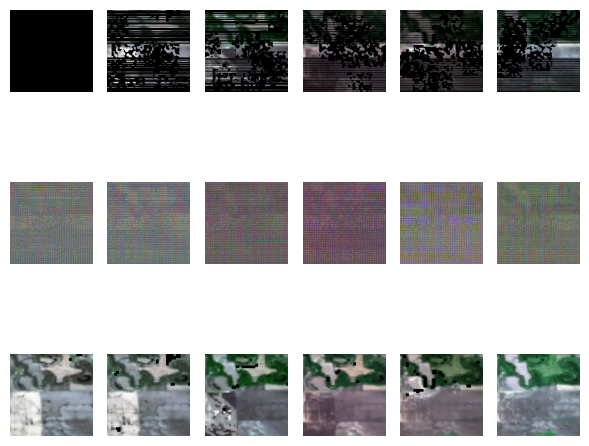

Epoch 2, Train loss.: 1.9872e+00
val_loss: 1.0625453392664592, mse: 0.03597771128018697, sam: 0.3488430579503377, psnr: 14.754735310872396, ssim: 0.13950698537392173
Epoch 3, Train loss.: 1.2774e+00
val_loss: 0.907687266667684, mse: 0.029207948595285416, sam: 0.3093430697917938, psnr: 15.641456604003906, ssim: 0.1705539478284149


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.24011543..0.9104982].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.3299993..0.9107438].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.25081143..0.9070648].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.26676896..0.797362].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.50417125..0.89647055].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.35002503..0.90851796].


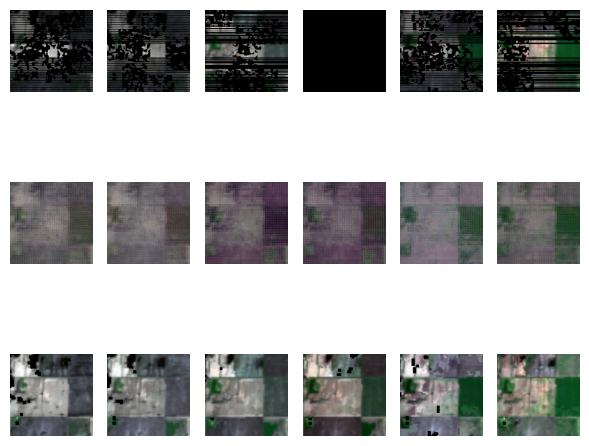

Epoch 4, Train loss.: 1.1075e+00
val_loss: 0.8238819638888041, mse: 0.02343037724494934, sam: 0.2795366148153941, psnr: 16.602686564127605, ssim: 0.20938573683916353


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07901002..1.0518694].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12576814..0.97098225].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13598694..0.97637665].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.18384355..0.8591851].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.22570205..0.96859646].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16707942..0.891848].


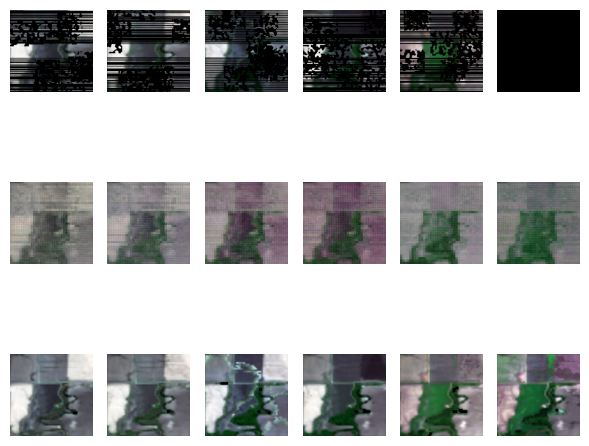

Epoch 5, Train loss.: 9.9762e-01
Model saved at epoch 5
val_loss: 0.7481359442075094, mse: 0.01996906225879987, sam: 0.25137267510096234, psnr: 17.32818603515625, ssim: 0.2539966539372784


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.23076645..0.8743884].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.23045932..0.8202969].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20583208..0.6747041].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.20730081..0.63356185].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.23228127..0.79252523].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.2961674..0.61609787].


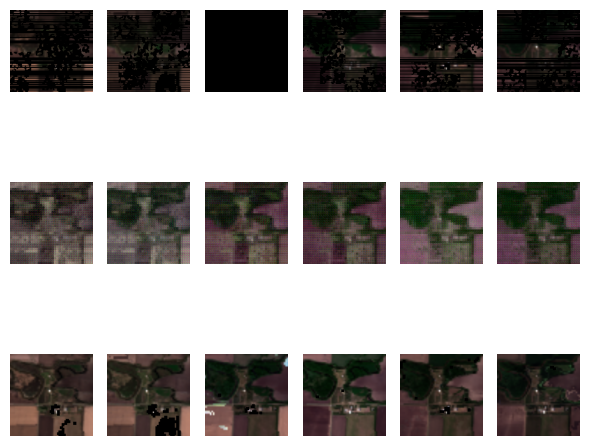

Epoch 6, Train loss.: 9.4429e-01
val_loss: 0.7325689991315206, mse: 0.017945506299535435, sam: 0.2459936092297236, psnr: 17.84434191385905, ssim: 0.2764726498792797


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1777269..0.99849045].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15401296..1.0353041].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1334115..0.7919068].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07418941..0.8470631].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10275157..0.8098944].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09235098..0.8089005].


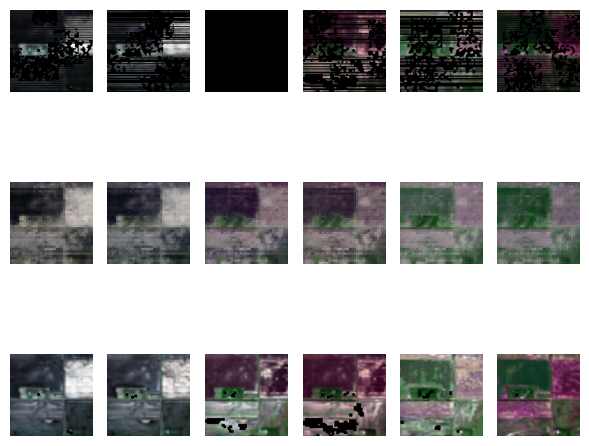

Epoch 7, Train loss.: 8.8213e-01
val_loss: 0.6878861387570699, mse: 0.0159181688601772, sam: 0.22890165448188782, psnr: 18.344460169474285, ssim: 0.31949614807213483
Epoch 8, Train loss.: 8.5484e-01
val_loss: 0.6719984610875448, mse: 0.015411614750822386, sam: 0.22170247634251913, psnr: 18.52947743733724, ssim: 0.3418244664862997


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.057797924..1.0385495].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024947189..0.9152821].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.021787278..0.83177733].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.032700397..0.8101925].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10483388..0.7777083].


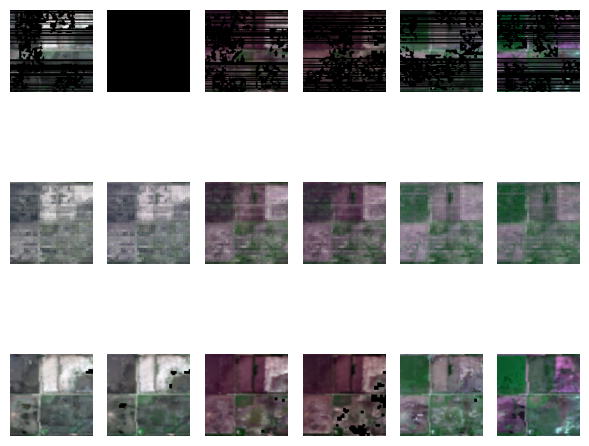

Epoch 9, Train loss.: 8.1614e-01
val_loss: 0.6465717355410258, mse: 0.014305407491823038, sam: 0.21535574396451315, psnr: 18.877834955851238, ssim: 0.35231655128287437
Epoch 10, Train loss.: 7.9881e-01
Model saved at epoch 10
val_loss: 0.6416663328806559, mse: 0.01391304936259985, sam: 0.21191364526748657, psnr: 18.992912928263348, ssim: 0.3695402377054167


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06901464..0.7130739].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07920113..0.72234726].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07292241..0.83861226].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.047978852..0.74158007].


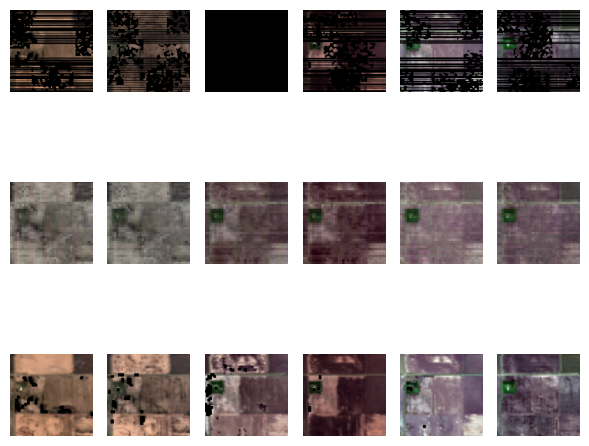

Epoch 11, Train loss.: 7.8337e-01
val_loss: 0.6327025294303894, mse: 0.013606822739044825, sam: 0.20890416204929352, psnr: 19.174575805664062, ssim: 0.3824406074253326


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03514338..0.89752173].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05094934..0.8806136].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.093296364..0.90555364].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08850768..0.8139939].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.112921566..0.85628325].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.098885916..0.8042111].


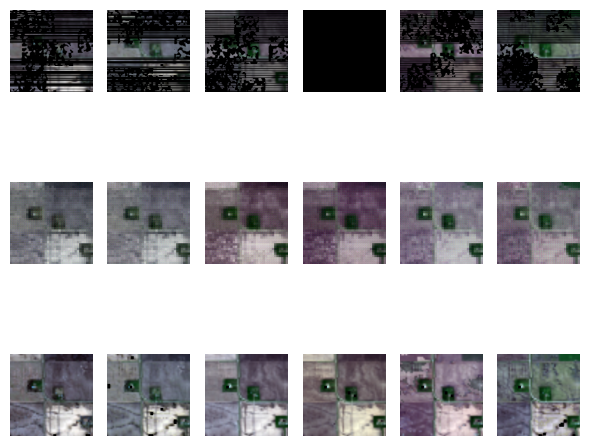

Epoch 12, Train loss.: 7.6789e-01
val_loss: 0.6227330366770426, mse: 0.013199338068564733, sam: 0.20659242073694864, psnr: 19.255138397216797, ssim: 0.380822443176638


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017253444..0.91960657].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.077761106..0.89569014].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0962165..0.87892693].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.17335962..0.87584984].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12342941..0.8868474].


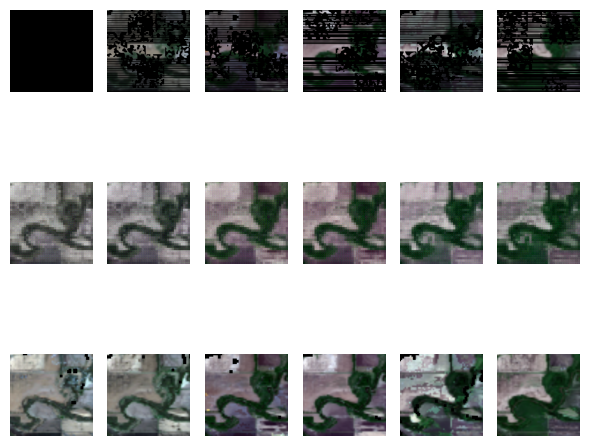

Epoch 13, Train loss.: 7.6942e-01
val_loss: 0.5993518829345703, mse: 0.012584852054715157, sam: 0.199371467034022, psnr: 19.4533265431722, ssim: 0.39190666685155123


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08298345..0.9698931].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.110003136..0.9485532].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15113..0.98907].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10960657..0.9215294].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13028271..0.84209764].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10072953..0.8710721].


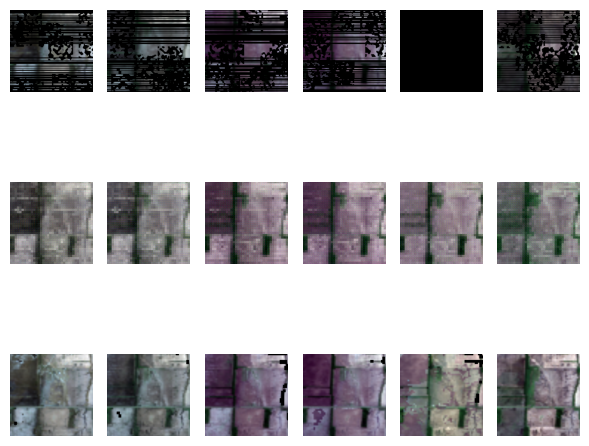

Epoch 14, Train loss.: 7.4965e-01
val_loss: 0.6127044161160787, mse: 0.012861056253314018, sam: 0.20280784368515015, psnr: 19.383503595987957, ssim: 0.39570816600305786


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024593279..0.99098015].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.049773403..0.9306845].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045366526..0.81785774].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07988811..0.7769591].


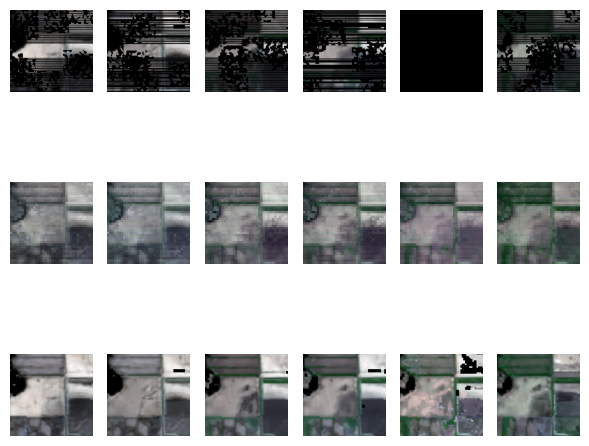

Epoch 15, Train loss.: 7.3949e-01
Model saved at epoch 15
val_loss: 0.594963272412618, mse: 0.012048930861055851, sam: 0.1977771818637848, psnr: 19.663097381591797, ssim: 0.4023976023024513
Epoch 16, Train loss.: 7.3752e-01
val_loss: 0.5891685088475546, mse: 0.01196080818772316, sam: 0.19554694493611655, psnr: 19.722930272420246, ssim: 0.41081770800680983


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0368513..1.0949446].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01614561..1.0971171].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09788495..0.92442304].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06694563..1.0769162].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043450426..1.1751984].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0011369722..1.1344439].


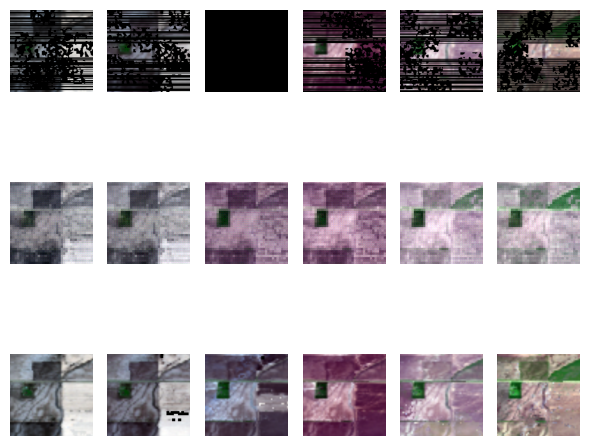

Epoch 17, Train loss.: 7.2457e-01
val_loss: 0.5880254507064819, mse: 0.01198724719385306, sam: 0.19489272932211557, psnr: 19.762935638427734, ssim: 0.4122683441241694
Epoch 18, Train loss.: 7.1856e-01
val_loss: 0.5791109204292297, mse: 0.01168469712138176, sam: 0.19245490928490958, psnr: 19.78740946451823, ssim: 0.4142183826875859


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07205033..0.70520806].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13023952..0.69257134].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10439314..0.6607495].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11979912..0.5754333].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1572522..0.6272109].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.16872498..0.6613035].


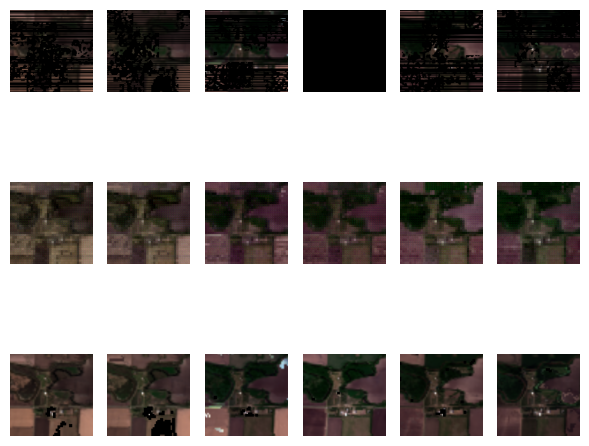

Epoch 19, Train loss.: 7.1126e-01
val_loss: 0.5663972496986389, mse: 0.010973713050285975, sam: 0.188384547829628, psnr: 20.069770177205402, ssim: 0.4299002950922784


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.091168925..0.94416374].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06876124..0.8693707].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.064192966..0.8121329].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.044906702..0.8723678].


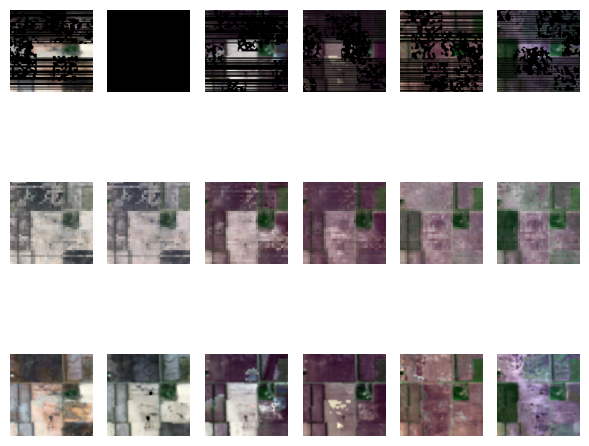

Epoch 20, Train loss.: 7.0533e-01
Model saved at epoch 20
val_loss: 0.566200315952301, mse: 0.011107133701443672, sam: 0.18803748488426208, psnr: 20.024049123128254, ssim: 0.43389329289404394


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0963908..1.1064202].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.14202161..1.0752034].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0044533443..0.8473863].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.051715937..0.95827705].


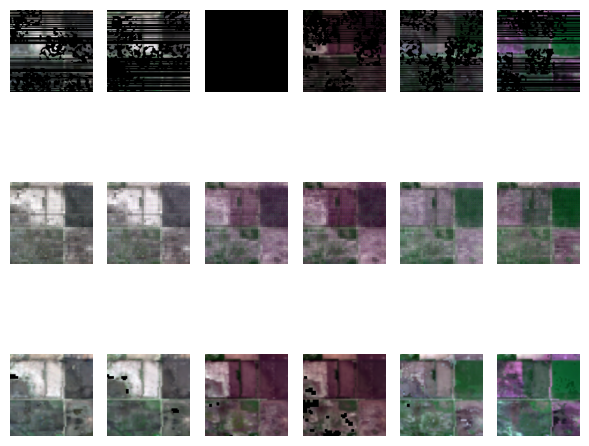

Epoch 21, Train loss.: 6.9941e-01
val_loss: 0.5582589109738668, mse: 0.010926992632448673, sam: 0.1852599581082662, psnr: 20.06361961364746, ssim: 0.43954736555782786


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.07004696..1.1232848].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.061809175..1.0678718].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.026382612..1.0877026].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0109645..1.0832103].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.026788866..0.9788064].


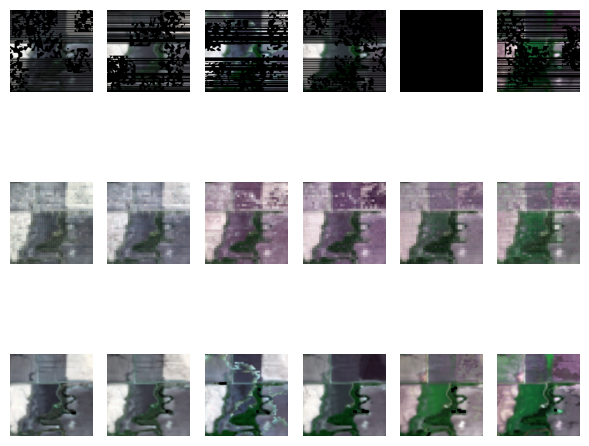

Epoch 22, Train loss.: 6.9529e-01
val_loss: 0.553633987903595, mse: 0.010885244545837244, sam: 0.18337188164393106, psnr: 20.11648178100586, ssim: 0.44066915507269605
Epoch 23, Train loss.: 6.9019e-01
val_loss: 0.5521332224210104, mse: 0.01117810575912396, sam: 0.18225622673829397, psnr: 20.029999415079754, ssim: 0.4471497573784922
Epoch 24, Train loss.: 6.8271e-01
val_loss: 0.5489006241162618, mse: 0.010574054904282093, sam: 0.18179797132809958, psnr: 20.2611083984375, ssim: 0.4542363948729729
Epoch 25, Train loss.: 6.8090e-01
Model saved at epoch 25
val_loss: 0.5523978273073832, mse: 0.010486704297363758, sam: 0.18262645105520883, psnr: 20.29478391011556, ssim: 0.45810627328299836
Epoch 26, Train loss.: 6.8326e-01
val_loss: 0.5462175210316976, mse: 0.010260475799441338, sam: 0.18136522670586905, psnr: 20.380747477213543, ssim: 0.4603919888196013


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.029827248..1.0166433].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.028341087..0.917938].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06569379..0.90843916].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.046103135..0.82560146].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008251008..0.9249717].


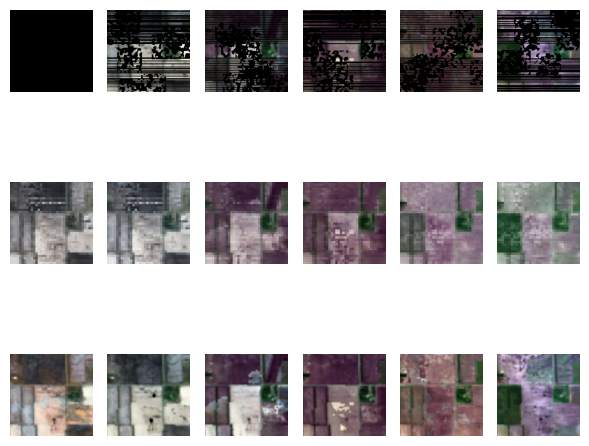

Epoch 27, Train loss.: 6.7452e-01
val_loss: 0.5444563627243042, mse: 0.010091189295053482, sam: 0.18070555726687113, psnr: 20.460230509440105, ssim: 0.457657081283037


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.064436965..0.85847443].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.044466794..0.77493227].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.112894244..0.5399977].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05898..0.5519593].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.038890027..0.5848996].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.14799292..0.5919799].


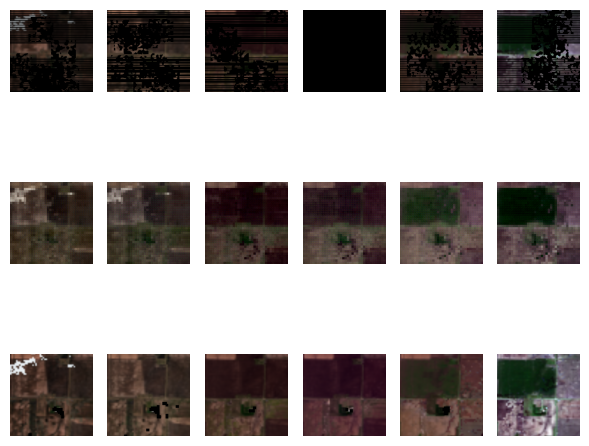

Epoch 28, Train loss.: 6.6854e-01
val_loss: 0.5373401045799255, mse: 0.010144088106850782, sam: 0.1776289095481237, psnr: 20.418694178263348, ssim: 0.4692520664721222


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060962442..0.9417987].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11135664..0.92110616].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0801788..0.91361403].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.062318724..0.8434016].


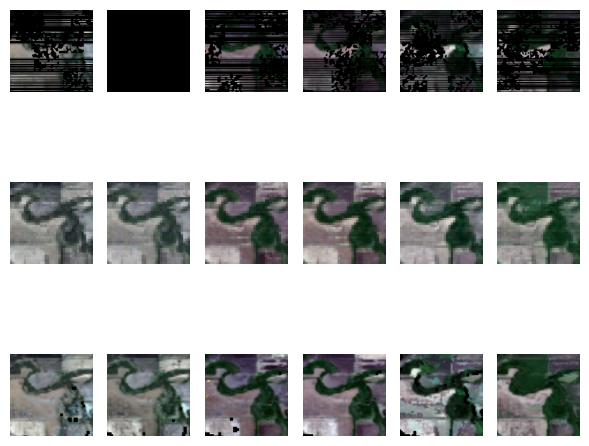

Epoch 29, Train loss.: 6.6509e-01
val_loss: 0.5264729261398315, mse: 0.009769702951113382, sam: 0.175063356757164, psnr: 20.616344451904297, ssim: 0.4723741962893155
Epoch 30, Train loss.: 6.6076e-01
Model saved at epoch 30
val_loss: 0.5308837294578552, mse: 0.009730920506020388, sam: 0.1761974642674128, psnr: 20.61635971069336, ssim: 0.47303513939193736
Epoch 31, Train loss.: 6.5700e-01
val_loss: 0.5124876499176025, mse: 0.00959448361148437, sam: 0.17032910883426666, psnr: 20.638776779174805, ssim: 0.47403632037001336


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048036464..0.9146638].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.033378225..0.8956984].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1804793..0.86602163].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.076852456..0.81245065].


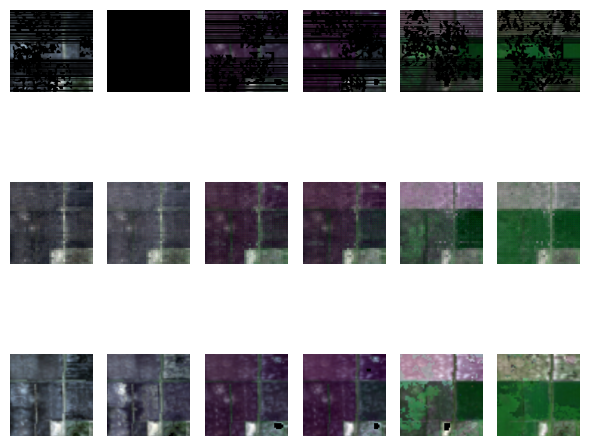

Epoch 32, Train loss.: 6.5401e-01
val_loss: 0.5207845767339071, mse: 0.00943397575368484, sam: 0.17250597973664603, psnr: 20.814831415812176, ssim: 0.48794748629503504


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08414569..1.118657].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.08405575..1.1493461].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.037728343..0.99632406].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06110871..0.875052].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017936537..0.93364125].


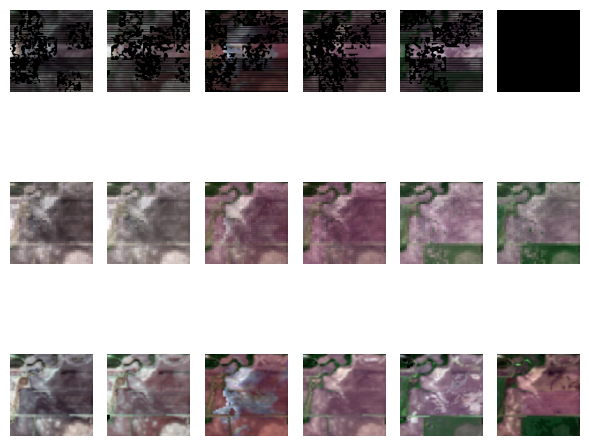

Epoch 33, Train loss.: 6.5372e-01
val_loss: 0.525704026222229, mse: 0.00943029330422481, sam: 0.1747027188539505, psnr: 20.80851173400879, ssim: 0.4833286095692883


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.054884423..1.1256003].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0925118..1.0050526].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.15264615..0.90873444].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10237394..0.7942731].


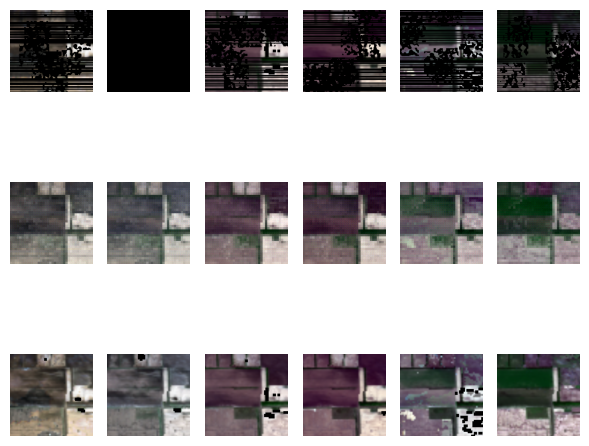

Epoch 34, Train loss.: 6.4598e-01
val_loss: 0.5131246646245321, mse: 0.009162273568411669, sam: 0.17053422331809998, psnr: 20.93285624186198, ssim: 0.48869382460945743
Epoch 35, Train loss.: 6.5713e-01
Model saved at epoch 35
val_loss: 0.5147564311822256, mse: 0.00935978131989638, sam: 0.17066362500190735, psnr: 20.81735102335612, ssim: 0.48856631177887094
Epoch 36, Train loss.: 6.4690e-01
val_loss: 0.5146951874097189, mse: 0.009072020339469114, sam: 0.17119460801283518, psnr: 20.91371472676595, ssim: 0.49102686230023423
Epoch 37, Train loss.: 6.3742e-01
val_loss: 0.5203111171722412, mse: 0.009315181834002336, sam: 0.17259958883126578, psnr: 20.87137730916341, ssim: 0.4925734582038581


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.019712672..1.0010122].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0038612292..0.9660497].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04385782..0.90969306].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0059132427..0.9961176].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007089727..1.020849].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.034478284..1.0508984].


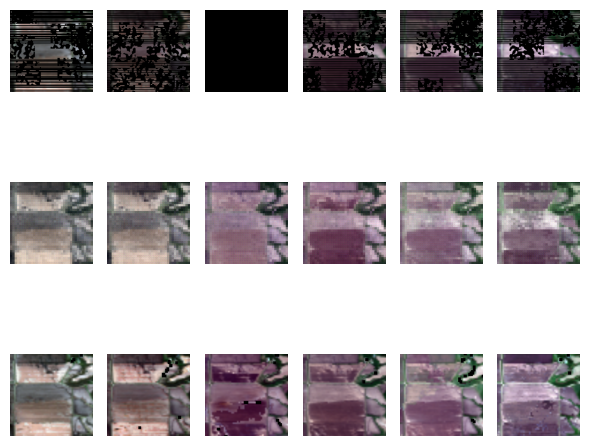

Epoch 38, Train loss.: 6.4673e-01
val_loss: 0.5151820580164591, mse: 0.009178240162630876, sam: 0.17090849578380585, psnr: 20.93862469991048, ssim: 0.49805552268569514


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.045083255..0.7983308].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.027884334..0.8429365].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.053074226..0.9006067].


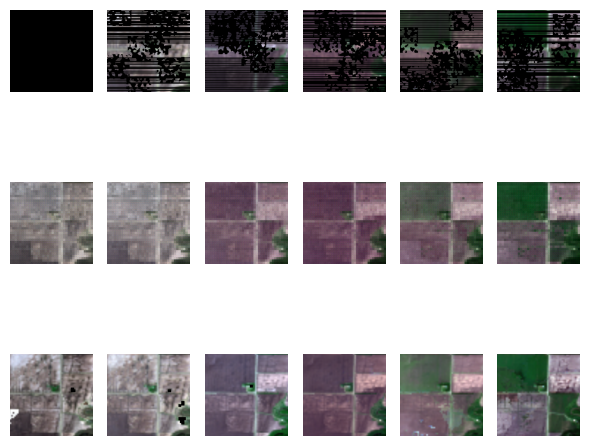

Epoch 39, Train loss.: 6.3629e-01
val_loss: 0.5015496214230856, mse: 0.008804586715996265, sam: 0.1668731321891149, psnr: 21.032304763793945, ssim: 0.4958232240011087


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02180079..1.0025754].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.040936552..0.9988639].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.020028709..1.0267465].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024700835..0.90669453].


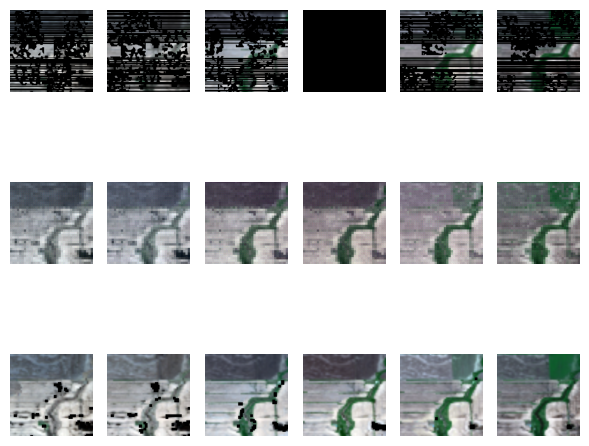

Epoch 40, Train loss.: 6.4089e-01
Model saved at epoch 40
val_loss: 0.5028410255908966, mse: 0.008759359208246073, sam: 0.1671809752782186, psnr: 21.097415924072266, ssim: 0.5005015988682265


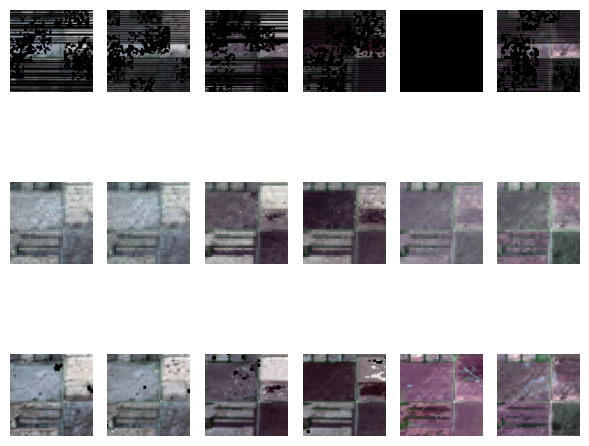

Epoch 41, Train loss.: 6.2911e-01
val_loss: 0.5072209437688192, mse: 0.008923733917375406, sam: 0.16846919556458792, psnr: 20.99465560913086, ssim: 0.501766638432717


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0026540274..1.0227084].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007253341..0.9772272].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007333051..0.828852].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0042913137..0.8416321].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0045908038..0.73344386].


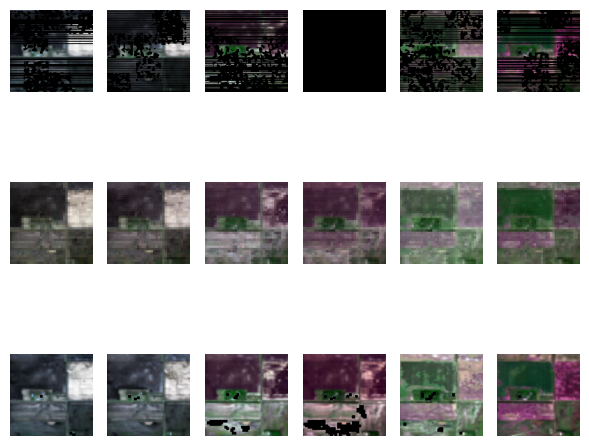

Epoch 42, Train loss.: 6.2761e-01
val_loss: 0.49918505549430847, mse: 0.00884090798596541, sam: 0.16553952793280283, psnr: 21.057105382283527, ssim: 0.5040463998797475
Epoch 43, Train loss.: 6.2477e-01
val_loss: 0.5041449666023254, mse: 0.009024014696478844, sam: 0.1673146386941274, psnr: 20.97913424173991, ssim: 0.5001457261276715
Epoch 44, Train loss.: 6.2196e-01
val_loss: 0.4857066075007121, mse: 0.008368930468956629, sam: 0.16156181196371713, psnr: 21.241107940673828, ssim: 0.5106775577057284
Epoch 45, Train loss.: 6.2138e-01
Model saved at epoch 45
val_loss: 0.4957316319147746, mse: 0.008543157329161962, sam: 0.16453353563944498, psnr: 21.24382781982422, ssim: 0.516453600992305
Epoch 46, Train loss.: 6.2021e-01
val_loss: 0.4992068608601888, mse: 0.008679772727191448, sam: 0.16563578446706137, psnr: 21.21258036295573, ssim: 0.5131518917101214


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.004256735..1.0094349].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03764089..0.9816715].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024381524..0.9253701].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013959899..1.0220283].


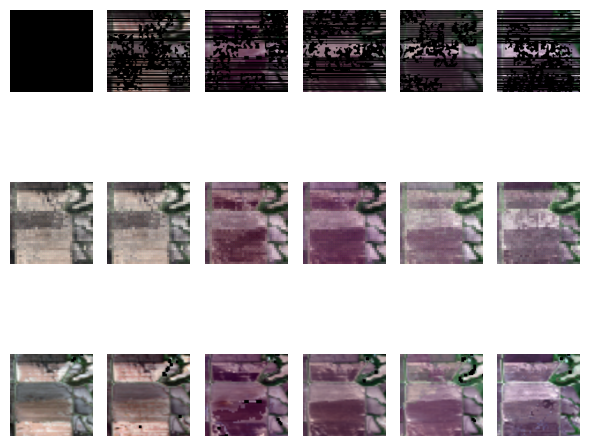

Epoch 47, Train loss.: 6.1625e-01
val_loss: 0.49071812629699707, mse: 0.008603867764274279, sam: 0.1627502143383026, psnr: 21.16912905375163, ssim: 0.5126758182876032


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.005148696..1.0228096].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0535445..0.9265539].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0575584..0.93916965].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.069018796..0.9903607].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0656252..1.0210695].


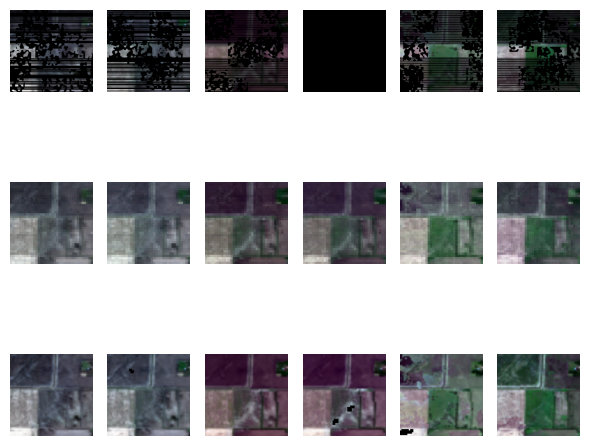

Epoch 48, Train loss.: 6.1303e-01
val_loss: 0.48878172039985657, mse: 0.00827693815032641, sam: 0.1625224451224009, psnr: 21.39183807373047, ssim: 0.5202643763011144


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029521411..0.8960637].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.023739403..0.8990239].


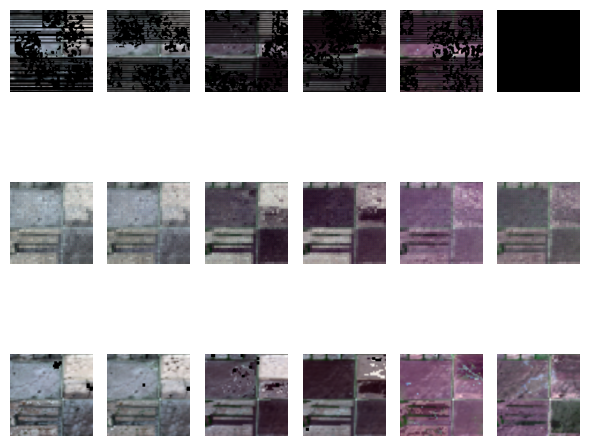

Epoch 49, Train loss.: 6.1226e-01
val_loss: 0.4952930410703023, mse: 0.008456864083806673, sam: 0.1645748813947042, psnr: 21.273387908935547, ssim: 0.5162999997567791


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0019543355..1.0913397].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.015753958..1.0637987].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.014609836..0.92543435].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.043719932..0.9669623].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.099620104..0.97381675].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0131750535..1.0427004].


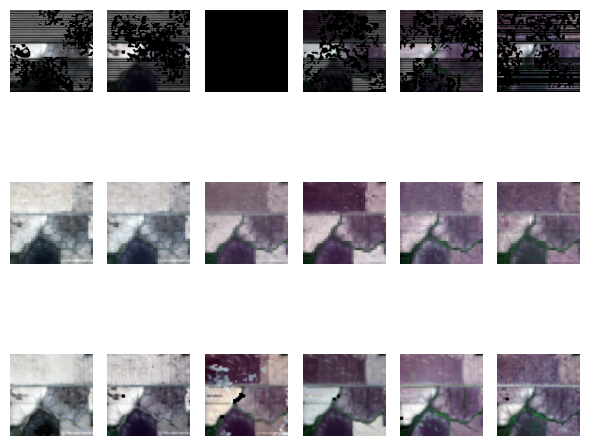

Epoch 50, Train loss.: 6.0983e-01
Model saved at epoch 50
val_loss: 0.4807158311208089, mse: 0.008121066726744175, sam: 0.1601273169120153, psnr: 21.402217229207356, ssim: 0.5204875054437953


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05946975..0.9251977].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.028162502..0.89968115].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.041128833..0.80115026].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.032237563..0.92395735].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013067855..0.90449685].


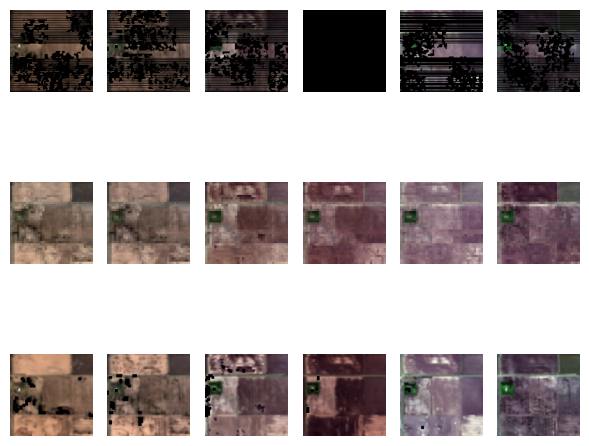

Epoch 51, Train loss.: 6.0645e-01
val_loss: 0.47810004154841107, mse: 0.0081749198337396, sam: 0.15871199468771616, psnr: 21.376250584920246, ssim: 0.5230614144153068
Epoch 52, Train loss.: 6.0639e-01
val_loss: 0.477439006169637, mse: 0.008104680416484674, sam: 0.1586615393559138, psnr: 21.409130096435547, ssim: 0.5270921574017677


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04638951..1.0187286].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.028888887..1.014356].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04485758..0.9229494].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.044643294..0.7692645].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05174526..0.7945985].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07559232..0.5837231].


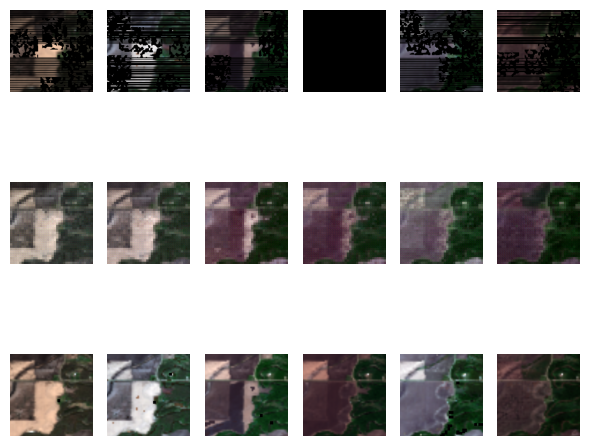

Epoch 53, Train loss.: 6.0706e-01
val_loss: 0.47480664650599164, mse: 0.008033505640923977, sam: 0.15809151033560434, psnr: 21.49622980753581, ssim: 0.5283203787960576
Epoch 54, Train loss.: 6.0376e-01
val_loss: 0.4764762322107951, mse: 0.007841439917683601, sam: 0.15874049067497253, psnr: 21.609839121500652, ssim: 0.5306714247795145


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.095720194..0.98032016].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.11402272..1.0106845].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13486229..0.9890809].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036899857..0.92603207].


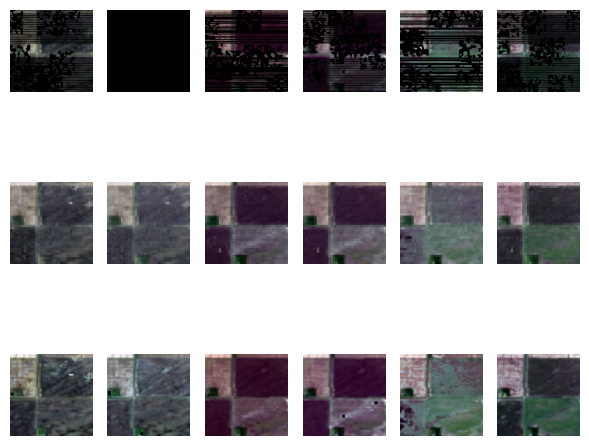

Epoch 55, Train loss.: 6.0232e-01
Model saved at epoch 55
val_loss: 0.4769188066323598, mse: 0.007988147748013338, sam: 0.15851501623789468, psnr: 21.50112024943034, ssim: 0.5292774393494468
Epoch 56, Train loss.: 6.0215e-01
val_loss: 0.47545476754506427, mse: 0.008055708681543669, sam: 0.15787666539351145, psnr: 21.499893188476562, ssim: 0.5327853467310204


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04957506..0.8647019].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.038508374..0.9583036].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022977922..0.9205044].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.010167574..0.9215418].


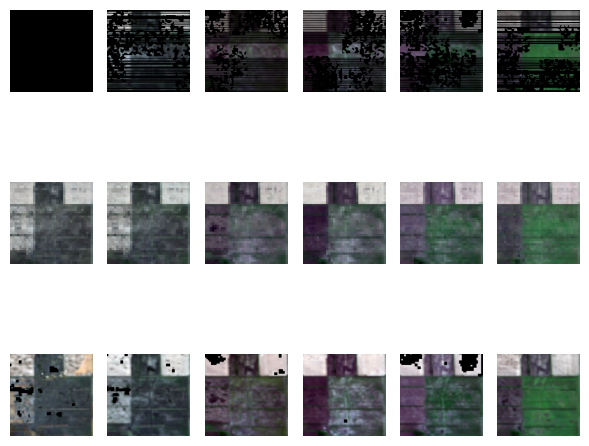

Epoch 57, Train loss.: 5.9900e-01
val_loss: 0.4659575919310252, mse: 0.007639349127809207, sam: 0.15542073051134744, psnr: 21.6713441212972, ssim: 0.5348796490834592


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02533918..0.9828399].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0072987163..0.9766452].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08590554..0.9452179].


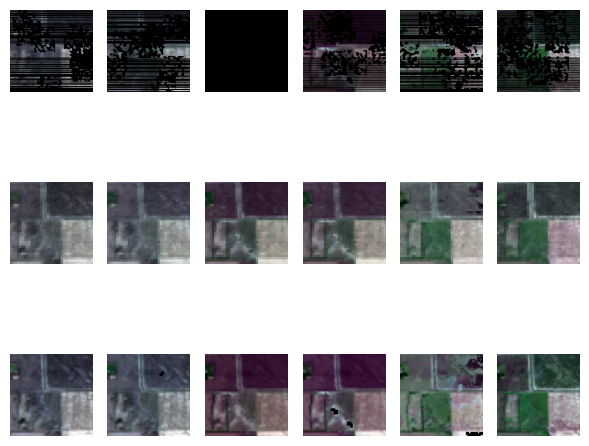

Epoch 58, Train loss.: 5.9929e-01
val_loss: 0.47222064932187396, mse: 0.008060613026221594, sam: 0.15726768970489502, psnr: 21.487937291463215, ssim: 0.5277977054836991
Epoch 59, Train loss.: 6.0565e-01
val_loss: 0.4711101750532786, mse: 0.007964261652280888, sam: 0.15646328528722128, psnr: 21.532878239949543, ssim: 0.5281018143606574


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.011494542..0.80954474].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12841181..0.9283384].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09605922..0.7825475].


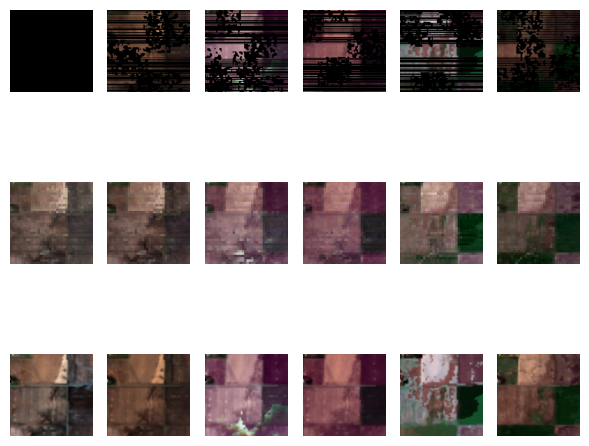

Epoch 60, Train loss.: 5.9630e-01
Model saved at epoch 60
val_loss: 0.47205453117688495, mse: 0.007669933761159579, sam: 0.15696612993876138, psnr: 21.683813095092773, ssim: 0.5342343443709562
Epoch 61, Train loss.: 6.0372e-01
val_loss: 0.46406052509943646, mse: 0.007716172685225804, sam: 0.15444683531920114, psnr: 21.59819984436035, ssim: 0.535041891114007


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.02449356..1.0543002].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.070943356..0.926482].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06499222..0.81957805].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06709087..1.0283933].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06663425..0.61908287].


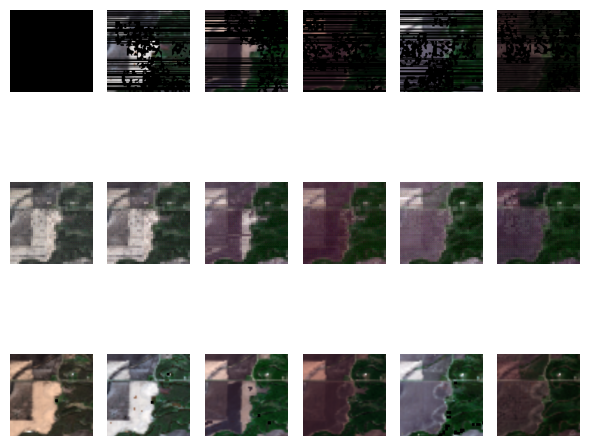

Epoch 62, Train loss.: 5.9517e-01
val_loss: 0.46539034446080524, mse: 0.007552741405864556, sam: 0.15519888202349344, psnr: 21.771783192952473, ssim: 0.5425640575559817


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.054604284..1.0370777].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.020563174..0.9852165].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.088438064..0.91015464].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055878352..0.94005007].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06548836..0.9821805].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022093754..0.8424727].


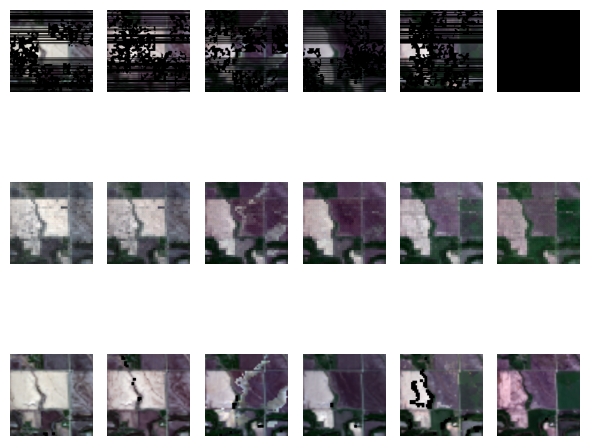

Epoch 63, Train loss.: 5.9273e-01
val_loss: 0.47083818912506104, mse: 0.007786609542866548, sam: 0.15656008323033652, psnr: 21.634426752726238, ssim: 0.5365111774126196


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008168194..1.0782297].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04946938..1.0711869].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.042340923..1.0167518].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06864203..0.97554946].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.073935196..0.9820858].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0035463383..0.8349659].


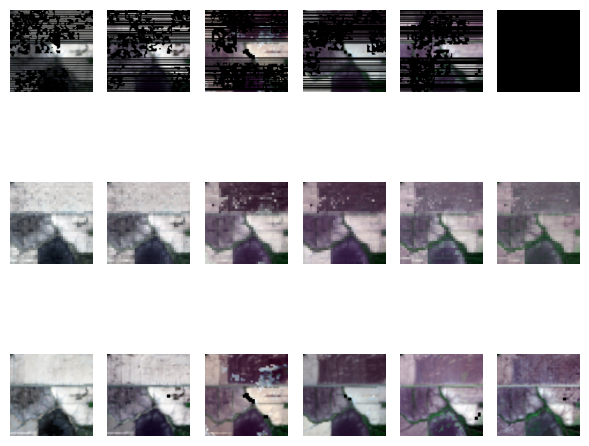

Epoch 64, Train loss.: 5.8924e-01
val_loss: 0.4722711245218913, mse: 0.0076800005820890265, sam: 0.15699621041615805, psnr: 21.78905995686849, ssim: 0.5435001813826893
Epoch 65, Train loss.: 5.8802e-01
Model saved at epoch 65
val_loss: 0.46947231888771057, mse: 0.007851111392180124, sam: 0.15600545207659403, psnr: 21.678130467732746, ssim: 0.542114339905097


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.02557329..1.0007713].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.049975883..1.0057011].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.02492947..1.005435].


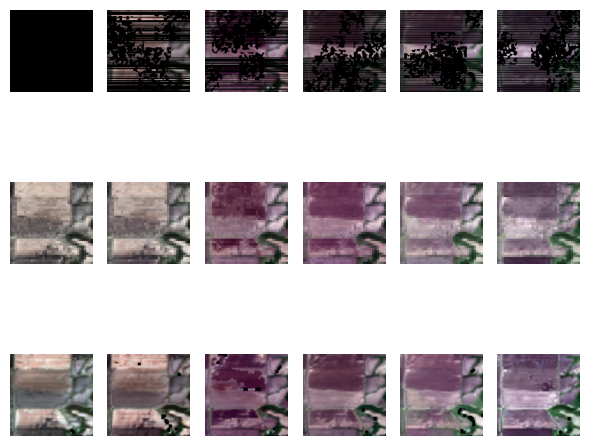

Epoch 66, Train loss.: 5.8920e-01
val_loss: 0.4704764187335968, mse: 0.007730747883518537, sam: 0.15635945896307626, psnr: 21.65526580810547, ssim: 0.5383851164036889
Epoch 67, Train loss.: 5.8751e-01
val_loss: 0.465295006831487, mse: 0.007727184022466342, sam: 0.15486141542593637, psnr: 21.68222427368164, ssim: 0.5388615087398235


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.038163666..0.75336367].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.090139054..0.7788541].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06977197..0.68797195].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036397357..0.6325936].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.101927705..0.61315924].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.079739295..0.56309193].


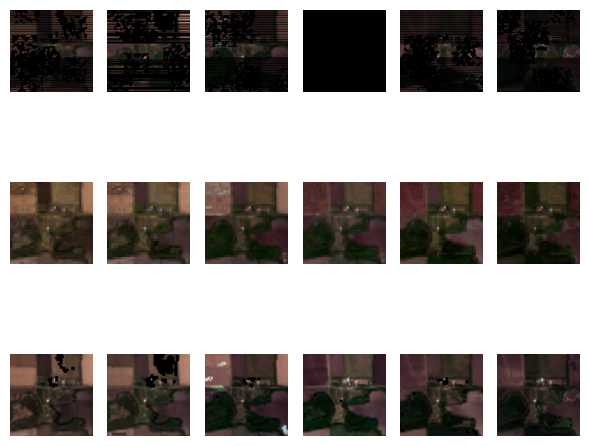

Epoch 68, Train loss.: 5.8612e-01
val_loss: 0.46742765108744305, mse: 0.0076272436417639256, sam: 0.155565212170283, psnr: 21.760910669962566, ssim: 0.5413550824554769


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0031876515..0.88170165].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.034889042..1.0319597].


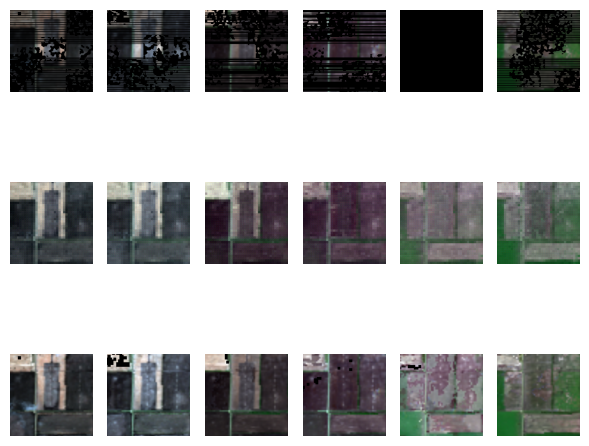

Epoch 69, Train loss.: 5.8153e-01
val_loss: 0.4581129848957062, mse: 0.007487184678514798, sam: 0.1526946077744166, psnr: 21.81779416402181, ssim: 0.5450689576949849


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.032596406..0.95705].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008618297..0.9152683].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09179614..0.91582334].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025857208..0.8499935].


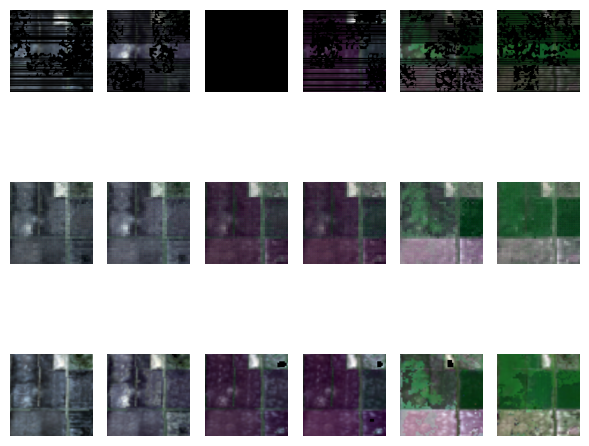

Epoch 70, Train loss.: 5.9411e-01
Model saved at epoch 70
val_loss: 0.46532193819681805, mse: 0.007533676611880462, sam: 0.1550934910774231, psnr: 21.826236089070637, ssim: 0.5422846518412007
Epoch 71, Train loss.: 5.8259e-01
val_loss: 0.4633226493994395, mse: 0.0073724957183003426, sam: 0.1545089731613795, psnr: 21.960849126180012, ssim: 0.5482908526393776


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06356946..0.9258842].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10574435..0.5743598].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.040337835..0.603749].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05464201..0.8352887].


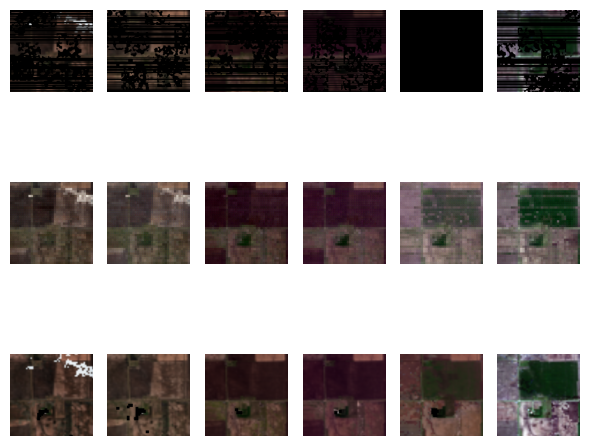

Epoch 72, Train loss.: 5.8598e-01
val_loss: 0.4601108332475026, mse: 0.0074797156266868114, sam: 0.15331260363260904, psnr: 21.772488911946613, ssim: 0.5448033722073112
Epoch 73, Train loss.: 5.8164e-01
val_loss: 0.45393626888593036, mse: 0.0072858515195548534, sam: 0.1513857493797938, psnr: 21.9053529103597, ssim: 0.5478024897574524


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.036897957..0.96453327].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017865647..0.89787865].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.085754596..0.5322165].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060076132..0.562731].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013856681..0.6993573].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.083238065..0.7393216].


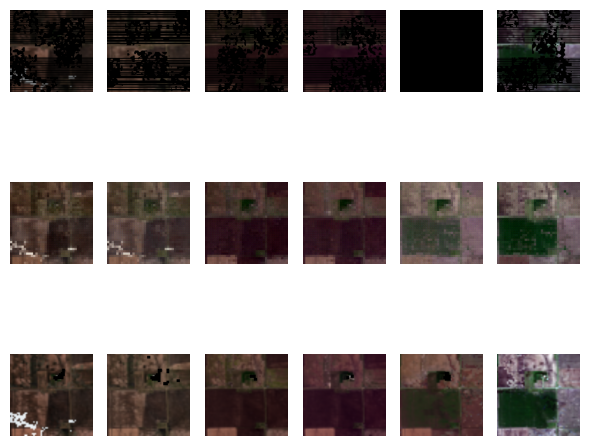

Epoch 74, Train loss.: 5.8028e-01
val_loss: 0.45648133754730225, mse: 0.0073596251507600146, sam: 0.15208256741364798, psnr: 21.956836064656574, ssim: 0.5485784871639273


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.047591683..1.0144749].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.037335612..0.98377883].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.048900183..1.0382651].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03592846..1.0295072].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04816744..1.0741338].


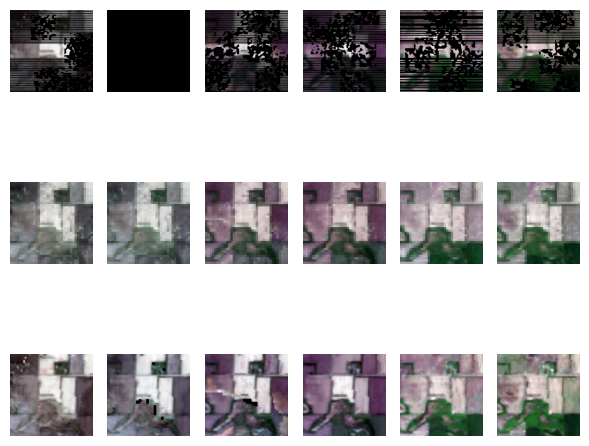

Epoch 75, Train loss.: 5.7879e-01
Model saved at epoch 75
val_loss: 0.4509080946445465, mse: 0.007282068797697623, sam: 0.15058675905068716, psnr: 21.906565984090168, ssim: 0.5471259716118301


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.01524872..1.0602194].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.012597211..1.0632237].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.052354176..1.0023899].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059094608..0.9247081].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.106789745..0.89348996].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.022705052..0.7807526].


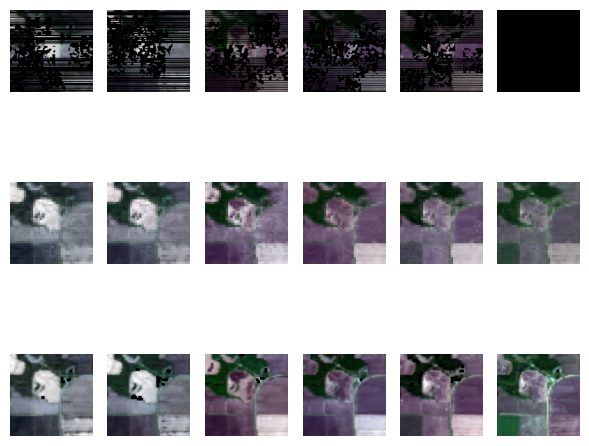

Epoch 76, Train loss.: 5.7782e-01
val_loss: 0.4512923260529836, mse: 0.007439312059432268, sam: 0.15025418996810913, psnr: 21.84905497233073, ssim: 0.547370520506974
Epoch 77, Train loss.: 5.8825e-01
val_loss: 0.45621737837791443, mse: 0.00723278879498442, sam: 0.15226622422536215, psnr: 21.96587562561035, ssim: 0.5503276986781511


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04015765..1.056814].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013846377..0.99443823].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04776321..0.8634509].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059374712..0.89827794].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06979659..0.75881773].


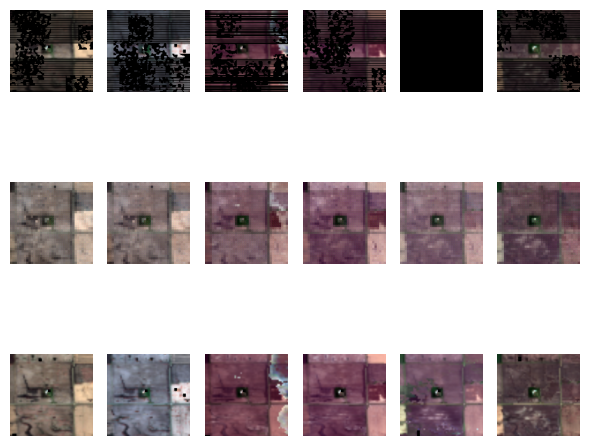

Epoch 78, Train loss.: 5.7471e-01
val_loss: 0.461486021677653, mse: 0.007499334247161944, sam: 0.15343688428401947, psnr: 21.874879201253254, ssim: 0.5483221130669587


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.056745384..0.8919721].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0075865164..0.9579312].


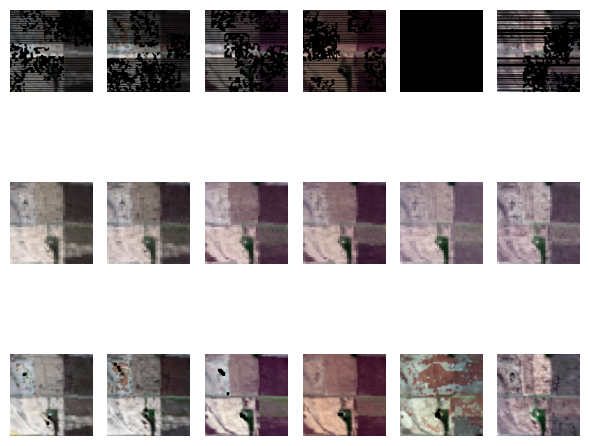

Epoch 79, Train loss.: 5.7583e-01
val_loss: 0.4551969567934672, mse: 0.00731998107706507, sam: 0.1517427215973536, psnr: 21.914974848429363, ssim: 0.550871553562994
Epoch 80, Train loss.: 5.7541e-01
Model saved at epoch 80
val_loss: 0.45006970564524335, mse: 0.007425315988560517, sam: 0.14990566670894623, psnr: 21.8517583211263, ssim: 0.5455207194483885
Epoch 81, Train loss.: 5.7576e-01
val_loss: 0.45298197865486145, mse: 0.007343896975119908, sam: 0.15098494788010916, psnr: 21.907269795735676, ssim: 0.5477766609176572


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.094407946..1.1453878].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.09056961..1.1526915].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0579589..0.9748044].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.01723409..0.9792033].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.029049288..0.9113557].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.068974964..0.8426327].


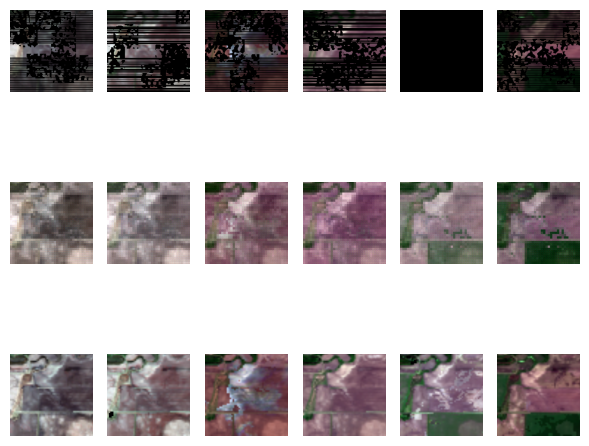

Epoch 82, Train loss.: 5.7356e-01
val_loss: 0.4495268166065216, mse: 0.0072853284267087775, sam: 0.15001737574736276, psnr: 21.944421132405598, ssim: 0.5502416137858103
Epoch 83, Train loss.: 5.7447e-01
val_loss: 0.4538031220436096, mse: 0.00737008669724067, sam: 0.15128093957901, psnr: 21.909239451090496, ssim: 0.5494386034634776


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10280423..1.025996].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0581893..1.1152465].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060479548..0.9033014].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06794659..0.7497179].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060576033..0.89409274].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06746039..0.5530852].


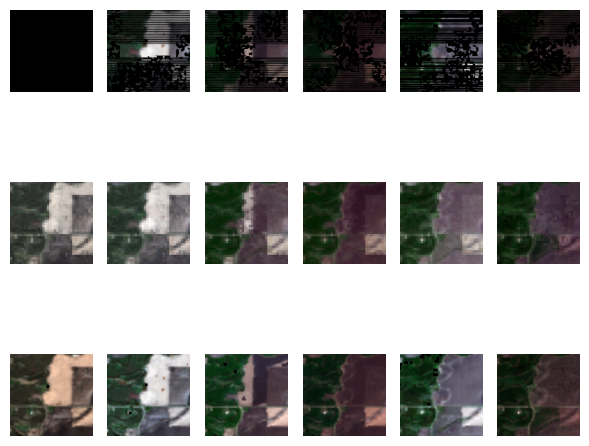

Epoch 84, Train loss.: 5.7739e-01
val_loss: 0.44717829426129657, mse: 0.007100382974992196, sam: 0.14932529628276825, psnr: 22.005828857421875, ssim: 0.552372373361602


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.049529556..0.870183].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06555559..0.9061374].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04125862..0.89816177].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06419104..0.9158558].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.060187664..0.8164443].


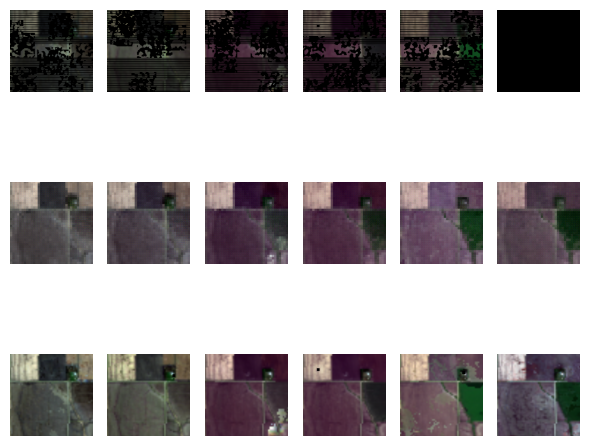

Epoch 85, Train loss.: 5.7303e-01
Model saved at epoch 85
val_loss: 0.4493538836638133, mse: 0.007114190297822158, sam: 0.1502510259548823, psnr: 21.990488052368164, ssim: 0.5508813942336396


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.051848285..0.8681925].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.008186037..0.84167135].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03313928..0.8711195].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.13674264..0.7927082].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03206919..0.9146408].


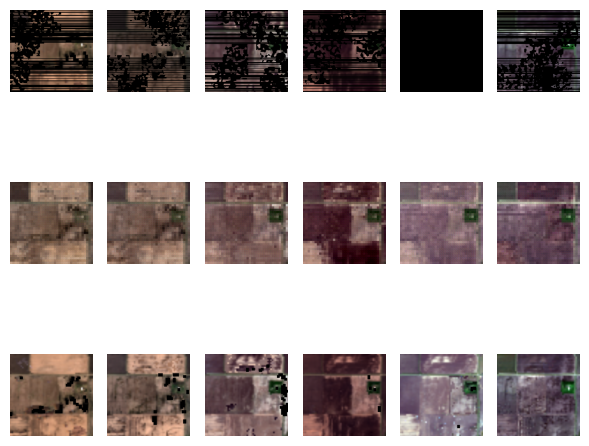

Epoch 86, Train loss.: 5.8098e-01
val_loss: 0.4486186405022939, mse: 0.007321095559746027, sam: 0.1494531830151876, psnr: 21.93514569600423, ssim: 0.5513190737375014
Epoch 87, Train loss.: 5.7187e-01
val_loss: 0.45044660568237305, mse: 0.007211468182504177, sam: 0.15033180018266043, psnr: 21.98329734802246, ssim: 0.5490735095351734
Epoch 88, Train loss.: 5.7071e-01
val_loss: 0.4533328016599019, mse: 0.0072244952122370405, sam: 0.15135594209035239, psnr: 21.971928278605144, ssim: 0.546863386826423


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.031743128..0.7752804].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.062410843..0.74279183].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07533376..0.77572685].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09339507..0.65619195].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.103964604..0.58880967].


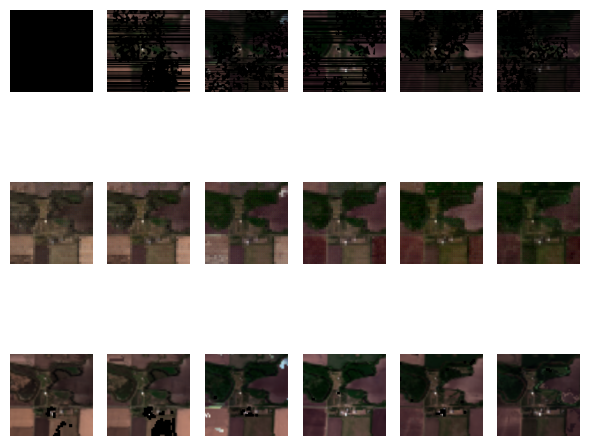

Epoch 89, Train loss.: 5.8140e-01
val_loss: 0.45222780108451843, mse: 0.0073233361666401224, sam: 0.1507912427186966, psnr: 21.98879051208496, ssim: 0.5535288916736908
Epoch 90, Train loss.: 5.7297e-01
Model saved at epoch 90
val_loss: 0.4407077332337697, mse: 0.007021039258688688, sam: 0.14733382066090903, psnr: 21.99949900309245, ssim: 0.5523309959963122


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.09497671..0.9924361].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.108842626..1.0172924].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.013714642..0.9221104].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07511333..1.037458].


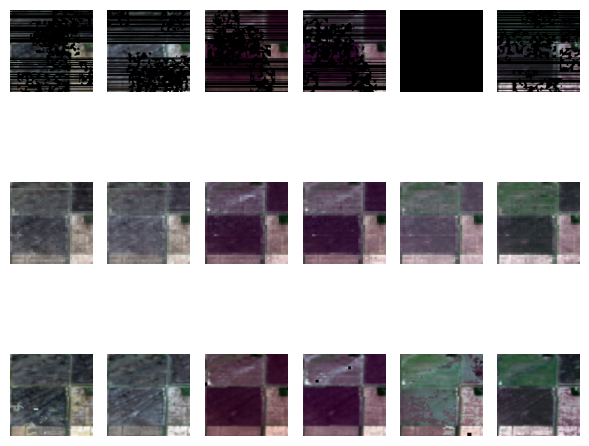

Epoch 91, Train loss.: 5.7028e-01
val_loss: 0.4522850314776103, mse: 0.0073680938221514225, sam: 0.15060030917326608, psnr: 21.936120351155598, ssim: 0.5506687525471651
Epoch 92, Train loss.: 5.7073e-01
val_loss: 0.44848724206288654, mse: 0.007173772901296616, sam: 0.1497973402341207, psnr: 21.9651673634847, ssim: 0.5484780400081739


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.008362323..1.0354091].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04465509..1.0345176].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.06788307..1.0833925].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.077486806..1.0518402].


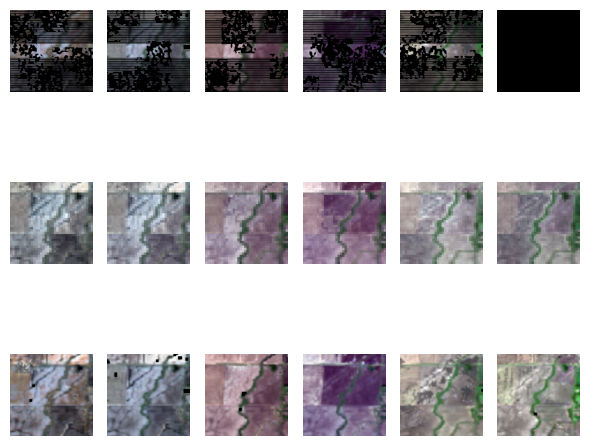

Epoch 93, Train loss.: 5.6813e-01
val_loss: 0.45451050996780396, mse: 0.007196605050315459, sam: 0.15170137584209442, psnr: 22.027626037597656, ssim: 0.5516256343347993
Epoch 94, Train loss.: 5.7195e-01
val_loss: 0.4436393777529399, mse: 0.0070087187923491, sam: 0.1483731617530187, psnr: 22.092766443888348, ssim: 0.5532157345126086


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0007503321..1.0124252].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.024240103..1.0148569].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.014135043..1.0011094].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009529032..1.0317342].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.017577132..0.97034293].


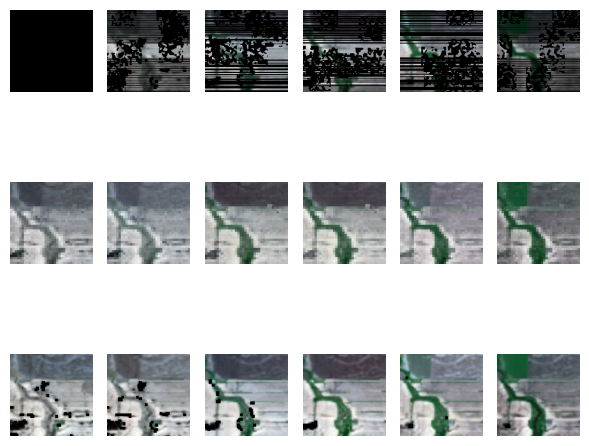

Epoch 95, Train loss.: 5.6940e-01
Model saved at epoch 95
val_loss: 0.4470043480396271, mse: 0.007114911762376626, sam: 0.14925921459992728, psnr: 21.975624084472656, ssim: 0.5503264265450387


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.041777126..1.0233777].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.07923204..0.90953624].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.06127554..1.0449729].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05353659..0.86387116].


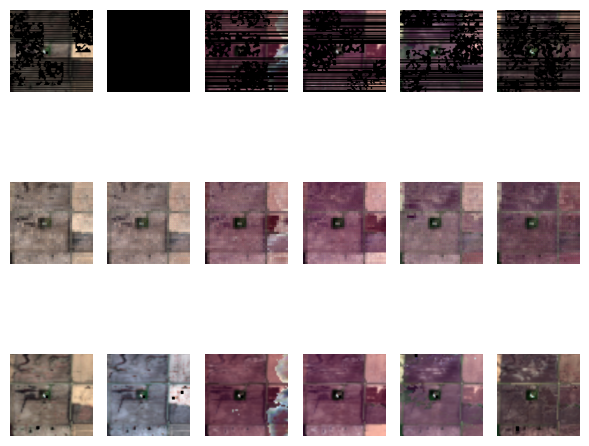

Epoch 96, Train loss.: 5.6791e-01
val_loss: 0.45750107367833454, mse: 0.007307220405588548, sam: 0.15237672130266824, psnr: 22.062035242716473, ssim: 0.553186511115326
Epoch 97, Train loss.: 5.6980e-01
val_loss: 0.4455762505531311, mse: 0.007015148022522529, sam: 0.14899286131064096, psnr: 22.091232299804688, ssim: 0.5535261218315083


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.03619007..0.91870075].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0035738212..0.7992294].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.05932823..0.53004223].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.025251439..0.57023764].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.08108395..0.6344226].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.051096763..0.7138955].


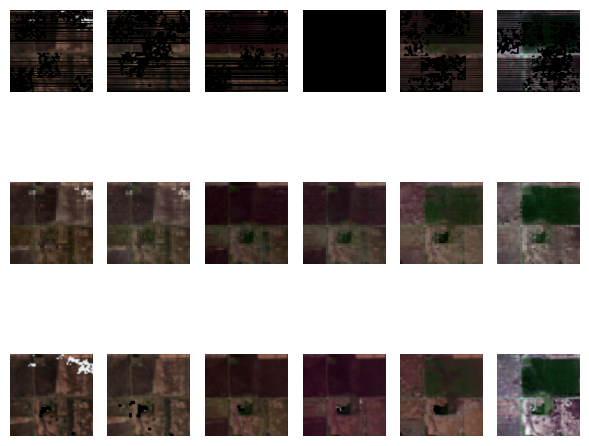

Epoch 98, Train loss.: 5.6907e-01
val_loss: 0.4471748272577922, mse: 0.007103744583825271, sam: 0.14941622813542685, psnr: 22.00378354390462, ssim: 0.5494552643805833


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.03928198..1.0698558].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.035678618..1.0380821].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.04690631..1.0768492].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.10753499..1.071795].


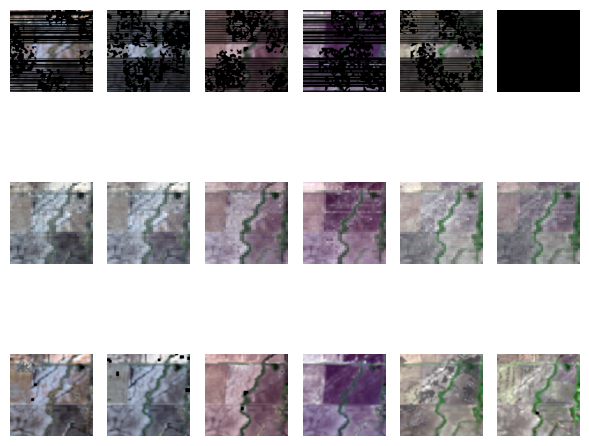

Epoch 99, Train loss.: 5.6760e-01
val_loss: 0.4507499833901723, mse: 0.007139930656800668, sam: 0.15024959047635397, psnr: 22.06537628173828, ssim: 0.5521722416693856


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0150131015..0.9533654].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.055311825..0.9602101].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.010278403..1.026759].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.046705835..1.0359603].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.009442133..1.1230813].


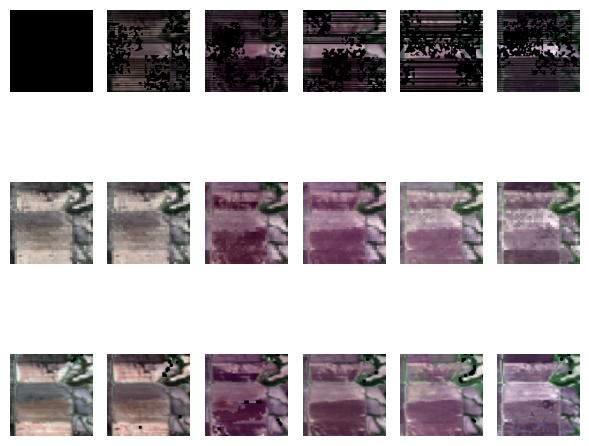

Epoch 100, Train loss.: 5.6724e-01
Model saved at epoch 100


In [5]:
# --------------------------------------------------------------------
# Start to train the model
# --------------------------------------------------------------------

# Initialize TensorBoard writer
writer = SummaryWriter(log_dir=log_dir)

for epoch in range(0, epoch_max):  # loop over the dataset multiple times
    model.train()
    train_loss = 0.0

    for i, data in enumerate(trainloader):
        inputs, targets, cloud_mask, added_cloud_mask, cls_targets, _ = data
        channel_each = inputs.shape[1] // time_span
        last_time_start = channel_each * (time_span - 1)
        last_time_end = channel_each * time_span
        optimizerG.zero_grad()
        outputs = model(inputs.to(device))
        # Apply cloud_mask to outputs and targets
        expanded_cloud_mask = cloud_mask.repeat_interleave(
            model.net.in_chans // time_span, dim=1
        )
        masked_outputs = outputs * expanded_cloud_mask.to(device)
        masked_targets = targets.to(device) * expanded_cloud_mask.to(device)

        valid_pixels_total = cloud_mask.sum()
        valid_pixel_counts = cloud_mask.sum(dim=(0, 2, 3))
        max_valid_pixel_index = np.argmax(valid_pixel_counts)

        B, TC, H, W = masked_outputs.shape
        T = TC // C

        if if_SAR:
            masked_outputs_reshaped = masked_outputs.view(B, T, C, H, W)
            masked_targets_reshaped = masked_targets.view(B, T, C, H, W)

            masked_outputs_reduced = masked_outputs_reshaped[:, :, : C - 2, :, :]
            masked_targets_reduced = masked_targets_reshaped[:, :, : C - 2, :, :]

            masked_outputs_reduced = masked_outputs_reduced.reshape(
                B, T * (C - 2), H, W
            )
            masked_targets_reduced = masked_targets_reduced.reshape(
                B, T * (C - 2), H, W
            )
            masked_outputs = masked_outputs_reduced
            masked_targets = masked_targets_reduced

        if valid_pixels_total > 0:
            loss = criterion(
                masked_outputs.to(device),
                masked_targets.to(device),
            )
        else:
            loss = torch.tensor(0.0, device=device, requires_grad=True)
        loss.backward()
        torch.nn.utils.clip_grad_norm_(
            model.parameters(), max_norm=1, norm_type=1, error_if_nonfinite=True
        )
        optimizerG.step()
        train_loss += loss.item()

    writer.add_scalar("Loss/Train", train_loss, epoch)

    model.eval()
    val_loss = 0.0
    mse, sam, psnr, ssim = 0, 0, 0, 0

    with torch.no_grad():
        for inputs, targets, cloud_mask, added_cloud_mask, _, _ in valloader:
            outputs = model(inputs.to(device))

            # Apply cloud mask to outputs and targets
            expanded_cloud_mask = cloud_mask.repeat_interleave(
                model.net.in_chans // time_span, dim=1
            )
            masked_outputs = outputs * expanded_cloud_mask.to(device)
            masked_targets = targets.to(device) * expanded_cloud_mask.to(device)
            B, TC, H, W = masked_outputs.shape
            T = TC // C

            if if_SAR:
                masked_outputs_reshaped = masked_outputs.view(B, T, C, H, W)
                masked_targets_reshaped = masked_targets.view(B, T, C, H, W)

                masked_outputs_reduced = masked_outputs_reshaped[:, :, : C - 2, :, :]
                masked_targets_reduced = masked_targets_reshaped[:, :, : C - 2, :, :]

                masked_outputs_reduced = masked_outputs_reduced.reshape(
                    B, T * (C - 2), H, W
                )
                masked_targets_reduced = masked_targets_reduced.reshape(
                    B, T * (C - 2), H, W
                )
                masked_outputs = masked_outputs_reduced
                masked_targets = masked_targets_reduced

            # Compute validation loss
            valid_pixels_total = cloud_mask.sum()
            if valid_pixels_total > 0:
                loss = criterion(
                    masked_outputs.to(device),
                    masked_targets.to(device),
                )
            else:
                loss = torch.tensor(0.0, device=device, requires_grad=False)

            val_loss += loss.item()

            # Compute additional metrics
            masked_outputs_np = masked_outputs.cpu().numpy()
            masked_targets_np = masked_targets.cpu().numpy()

            mse += mean_squared_error(
                masked_targets_np.flatten(), masked_outputs_np.flatten()
            )
            sam += spectral_angle_mapper_numpy(masked_outputs_np, masked_targets_np)
            psnr += peak_signal_to_noise_ratio(masked_targets_np, masked_outputs_np)
            ssim += structural_similarity_index(masked_targets_np, masked_outputs_np)

        val_loss /= len(valloader)
        mse /= len(valloader) / batch_size
        sam /= len(valloader) / batch_size
        psnr /= len(valloader) / batch_size
        ssim /= len(valloader) / batch_size

    # Log validation loss and metrics to TensorBoard
    writer.add_scalar("Loss/Validation", val_loss, epoch)
    writer.add_scalar("Metrics/MSE", mse, epoch)
    writer.add_scalar("Metrics/SAM", sam, epoch)
    writer.add_scalar("Metrics/PSNR", psnr, epoch)
    writer.add_scalar("Metrics/SSIM", ssim, epoch)

    print(f"val_loss: {val_loss}, mse: {mse}, sam: {sam}, psnr: {psnr}, ssim: {ssim}")

    with torch.no_grad():
        random_indices = random.sample(range(0, 5), 1)
        for i, (inputs, targets, cloud_mask, cloud_mask_added, _, _) in enumerate(
            valloader
        ):
            if i in random_indices:
                outputs = model(inputs.to(device)).cpu()

                input_images, _ = create_time_series_pseudo_color_image(
                    inputs[0, :, :, :].squeeze(0),
                    cloud_mask[0, :, :, :].squeeze(0),
                    cloud_mask_added[0, :, :, :].squeeze(0),
                )
                output_images, _ = create_time_series_pseudo_color_image(
                    outputs[0, :, :, :].squeeze(0),
                    cloud_mask[0, :, :, :].squeeze(0),
                    cloud_mask_added[0, :, :, :].squeeze(0),
                )
                targets_images, _ = create_time_series_pseudo_color_image(
                    targets[0, :, :, :].squeeze(0),
                    cloud_mask[0, :, :, :].squeeze(0),
                    cloud_mask_added[0, :, :, :].squeeze(0),
                )

                all_images = [
                    input_images,
                    output_images,
                    targets_images,
                ]

                fig, axes = plt.subplots(
                    len(all_images), len(targets_images), figsize=(6, 6)
                )

                for i, image_list in enumerate(all_images):
                    for j in range(len(image_list)):
                        axes[i][j].imshow(image_list[j])
                        axes[i][j].axis("off")

                plt.tight_layout()
                plt.show()
                break

    scheduler.step()
    train_hist.append(train_loss / len(trainloader))
    save_model(path, model, train_hist, optimizerG, scheduler=scheduler)
    print("Epoch {}, Train loss.: {:0.4e}".format(epoch + 1, train_hist[-1]))
    if (epoch + 1) % 5 == 0:
        save_model(
            path, model, train_hist, optimizerG, scheduler=scheduler, epoch=epoch
        )
        print(f"Model saved at epoch {epoch + 1}")

## Validation Procedure

In [32]:
# To BE DONE

import torch
from tqdm import tqdm
import os

os.environ["CUDA_VISIBLE_DEVICES"] = "0"
device = "cuda" if torch.cuda.is_available() else "cpu"

if_write = False

current_time = datetime.now().strftime("%Y%m%d-%H%M%S")
log_dir = f"/home/snt/projects_lujun/vitCausalSeries/data/training/logs/my_experiment_{current_time}"
path = log_dir
val_path = "/home/snt/projects_lujun/vitCausalSeries/data/intermediate_SAR_2021/output_patches_time_series_with_city/val"
checkpoint_base_folder = "/home/snt/projects_lujun/vitCausalSeries/data/training/logs"
training_model_folder = "my_experiment_20250108-120651_reconstruction"
checkpoint_path = f"{checkpoint_base_folder}/{training_model_folder}/checkpoint_100.pth"
outputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_outputs"
targets_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_targets"
inputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_inputs"
cloud_mask_folder = f"{checkpoint_base_folder}/{training_model_folder}/cloud_mask"
val_dataset = ImagenetDataset(
    if_SAR=if_SAR,
    isval=True,
    add_cloud_mask=True,
    add_kspace_mask=False,
    add_random_time_mask=False,
    val_path=val_path,
)

valloader = DataLoader(
    val_dataset,
    batch_size=batch_size,
    shuffle=False,
    # num_workers=1,
    pin_memory=True,
    generator=torch.Generator().manual_seed(seed),
)


checkpoint = torch.load(checkpoint_path, map_location=device)

model.load_state_dict(checkpoint["model_state_dict"])

# optimizer.load_state_dict(checkpoint['optimizer_state_dict'])

# epoch = checkpoint['epoch']

print("Checkpoint loaded successfully!")

/tmp/ipykernel_3993917/686568059.py:42: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  checkpoint = torch.load(checkpoint_path, map_location=device)


Checkpoint loaded successfully!


In [33]:
def write_tiff(output_path, image):
    if image.ndim == 2:
        image = image[np.newaxis, ...]

    bands, height, width = image.shape

    driver = gdal.GetDriverByName("GTiff")
    dataset = driver.Create(
        output_path,
        width,
        height,
        bands,
        gdal.GDT_Float32,
    )

    if dataset is None:
        raise RuntimeError(f"Unable to create TIFF file: {output_path}")

    # Write each band to the dataset
    for i in range(bands):
        band = dataset.GetRasterBand(i + 1)
        band.WriteArray(image[i, :, :])
        band.FlushCache()  # Ensure data is written to disk

    dataset = None

In [ ]:
model.eval()
val_loss = 0.0
mse, sam, psnr, ssim = 0, 0, 0, 0

if if_write:

    os.makedirs(outputs_folder, exist_ok=True)
    os.makedirs(targets_folder, exist_ok=True)
    os.makedirs(inputs_folder, exist_ok=True)
    os.makedirs(cloud_mask_folder, exist_ok=True)


# Start validation
with torch.no_grad():
    # Wrap valloader with tqdm for progress tracking
    for batch_idx, (
        inputs,
        targets,
        cloud_mask,
        added_cloud_mask,
        cls_targets,
        file_name,
    ) in enumerate(tqdm(valloader, desc="Validation Progress")):
        outputs = model(inputs.to(device))
        expanded_cloud_mask = cloud_mask.repeat_interleave(
            model.net.in_chans // time_span, dim=1
        )
        masked_outputs = outputs * expanded_cloud_mask.to(device)
        masked_targets = targets.to(device) * expanded_cloud_mask.to(device)
        B, TC, H, W = masked_outputs.shape
        T = TC // C

        if if_SAR:
            masked_outputs_reshaped = masked_outputs.view(B, T, C, H, W)
            masked_targets_reshaped = masked_targets.view(B, T, C, H, W)

            masked_outputs_reduced = masked_outputs_reshaped[:, :, : C - 2, :, :]
            masked_targets_reduced = masked_targets_reshaped[:, :, : C - 2, :, :]

            masked_outputs_reduced = masked_outputs_reduced.reshape(
                B, T * (C - 2), H, W
            )
            masked_targets_reduced = masked_targets_reduced.reshape(
                B, T * (C - 2), H, W
            )
            masked_outputs = masked_outputs_reduced
            masked_targets = masked_targets_reduced

        # Compute validation loss
        valid_pixels_total = cloud_mask.sum()
        if valid_pixels_total > 0:
            loss = criterion(
                masked_outputs.to(device),
                masked_targets.to(device),
            )
        else:
            loss = torch.tensor(0.0, device=device, requires_grad=False)

        val_loss += loss.item()

        # Save as NumPy arrays
        if if_write:
            for i in range(B):  # Process each item in the batch
                base_filename = os.path.splitext(file_name[i])[0]
                output_filename = os.path.join(
                    outputs_folder, f"{base_filename}_output.tiff"
                )
                target_filename = os.path.join(
                    targets_folder, f"{base_filename}_target.tiff"
                )
                input_filename = os.path.join(
                    inputs_folder, f"{base_filename}_input.tiff"
                )
                cloud_mask_filename = os.path.join(
                    cloud_mask_folder, f"{base_filename}_cloud_mask.tiff"
                )

                write_tiff(output_path=target_filename, image=targets[i].cpu().numpy())
                write_tiff(output_path=output_filename, image=outputs[i].cpu().numpy())
                write_tiff(output_path=input_filename, image=inputs[i].cpu().numpy())
                write_tiff(
                    output_path=cloud_mask_filename, image=cloud_mask[i].cpu().numpy()
                )
        # Compute additional metrics
        masked_outputs_np = masked_outputs.cpu().numpy()
        masked_targets_np = masked_targets.cpu().numpy()

        mse += mean_squared_error(
            masked_targets_np.flatten(), masked_outputs_np.flatten()
        )
        sam += spectral_angle_mapper_numpy(masked_outputs_np, masked_targets_np)
        psnr += peak_signal_to_noise_ratio(masked_targets_np, masked_outputs_np)
        ssim += structural_similarity_index(masked_targets_np, masked_outputs_np)
        current_ssim = structural_similarity_index(masked_targets_np, masked_outputs_np)
        ssim += structural_similarity_index(masked_targets_np, masked_outputs_np)

    val_loss /= len(valloader)
    mse /= len(valloader)
    sam /= len(valloader)
    psnr /= len(valloader)
    ssim /= len(valloader)

    print(
        f"Validation Loss: {val_loss:.4f}, MSE: {mse:.4f}, SAM: {sam:.4f}, PSNR: {psnr:.4f}, SSIM: {ssim:.4f}"
    )

Validation Progress: 100%|██████████| 51/51 [09:17<00:00, 10.93s/it]

Validation Loss: 0.9574, MSE: 0.3667, SAM: 6.2181, PSNR: 373.9770, SSIM: 16.5550


In [40]:
tt = 1

tt /= 10 / 8

print(tt)

0.8


## Calcuate The results seperately

In [31]:
import os
import numpy as np
from tqdm import tqdm
from sklearn.metrics import mean_squared_error
from osgeo import gdal
from utils.losses import (
    spectral_angle_mapper_numpy,
    peak_signal_to_noise_ratio,
    structural_similarity_index,
)


# Device
device = "cpu"  # No need for GPU as we're only using numpy


def read_tiff(file_path):
    dataset = gdal.Open(file_path)
    if not dataset:
        raise FileNotFoundError(f"Unable to open the file: {file_path}")
    band_count = dataset.RasterCount
    bands_data = []
    for i in range(1, band_count + 1):
        band = dataset.GetRasterBand(i)
        band_name = band.GetDescription()
        band_data = band.ReadAsArray()
        bands_data.append(band_data)

    image = np.stack(bands_data, axis=0)
    return image


checkpoint_base_folder = "/home/snt/projects_lujun/vitCausalSeries/data/training/logs"
training_model_folder = "my_experiment_20250108-120651_reconstruction"

outputs_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_outputs"
targets_folder = f"{checkpoint_base_folder}/{training_model_folder}/masked_targets"
cloud_mask_folder = f"{checkpoint_base_folder}/{training_model_folder}/cloud_mask"

if_SAR = True


def compute_metrics(targets_folder, outputs_folder, cloud_mask_folder):
    """Compute MSE, SAM, PSNR, and SSIM for images in the specified folders."""
    mse_total, sam_total, psnr_total, ssim_total = 0, 0, 0, 0
    file_list = [
        file_name
        for file_name in os.listdir(targets_folder)
        if file_name.endswith(".tiff")
    ]
    num_files = len(file_list)

    if num_files == 0:
        raise ValueError("No valid files found for metric computation.")

    # Iterate through files with a progress bar
    for file_name in tqdm(file_list, desc="Computing metrics", total=num_files):
        base_name, ext = os.path.splitext(file_name)
        base_name = base_name.replace("target", "")

        target_path = os.path.join(targets_folder, f"{base_name}target.tiff")
        output_path = os.path.join(outputs_folder, f"{base_name}output.tiff")
        cloud_path = os.path.join(cloud_mask_folder, f"{base_name}cloud_mask.tiff")

        # Read images
        target = read_tiff(target_path)
        output = read_tiff(output_path)
        cloud_mask = read_tiff(cloud_path)

        target = np.expand_dims(target, axis=0)
        output = np.expand_dims(output, axis=0)
        cloud_mask = np.expand_dims(cloud_mask, axis=0)

        expanded_cloud_mask = np.repeat(
            cloud_mask, target.shape[1] // cloud_mask.shape[1], axis=1
        )
        masked_outputs = output * expanded_cloud_mask
        masked_targets = target * expanded_cloud_mask

        if if_SAR:
            masked_outputs = masked_outputs[:, : masked_outputs.shape[1] - 2, :, :]
            masked_targets = masked_targets[:, : masked_targets.shape[1] - 2, :, :]

        # Compute metrics
        target = masked_targets.astype(np.float32)
        output = masked_outputs.astype(np.float32)

        mse_total += mean_squared_error(target.flatten(), output.flatten())
        sam_total += spectral_angle_mapper_numpy(output, target)
        psnr_total += peak_signal_to_noise_ratio(target, output)
        ssim_total += structural_similarity_index(
            target, output
        )  # Assuming multichannel images

    # Compute averages
    mse_avg = mse_total / num_files
    sam_avg = sam_total / num_files
    psnr_avg = psnr_total / num_files
    ssim_avg = ssim_total / num_files

    return mse_avg, sam_avg, psnr_avg, ssim_avg


# Compute and print metrics
mse, sam, psnr, ssim = compute_metrics(
    targets_folder, outputs_folder, cloud_mask_folder
)
print(f"MSE: {mse:.4f}, SAM: {sam:.4f}, PSNR: {psnr:.4f}, SSIM: {ssim:.4f}")

Computing metrics: 100%|██████████| 1014/1014 [03:51<00:00,  4.38it/s]

MSE: 0.0184, SAM: 0.3118, PSNR: 18.6839, SSIM: 0.4130


In [20]:
cloud_mask.shape

torch.Size([14, 6, 180, 180])